In [23]:
"""
Author: Rahul Sha Pathepur Shankar, Vaishnav Raja & Reza Farrokhi Saray
CS 5330 Pattern Recognition and Computer Vision - Spring 2025 - Final Project

This code is part of the 6D pose estimation for the Industrial Plentopic Dataset (IPD)
This is used to find the inferece of the model to find the 6D Pose estimations.
"""

import os
os.environ["PYOPENGL_PLATFORM"] = "egl"
import pyrender
import cv2
import glob
import json
import time
import trimesh
import numpy as np
import matplotlib.pyplot as plt
np.set_printoptions(suppress=True, precision=3)
from scipy.spatial.transform import Rotation as R
from bpc.inference.utils.camera_utils import load_camera_params
from bpc.inference.process_pose import PoseEstimator, PoseEstimatorParams, load_pose_model
from bpc.utils.data_utils import Capture, render_mask
import bpc.utils.data_utils as du
import importlib
from scipy.spatial.transform import Rotation as SRot
print("Importation Completed")

Importation Completed


Auto-detected rotation mode from checkpoint: quat
Using rotation mode: quat
Loading camera parameters from: ./ipd/ipd_val/val/000007/scene_camera_cam3.json
[array([[  -0.133,    0.058,   -0.989,  373.035],
       [   0.991,   -0.025,   -0.135,  265.094],
       [  -0.033,   -0.998,   -0.054, 1734.644],
       [   0.   ,    0.   ,    0.   ,    1.   ]]), array([[   0.042,    0.902,   -0.43 ,   28.142],
       [   0.003,   -0.431,   -0.902,  186.917],
       [  -0.999,    0.036,   -0.021, 1738.924],
       [   0.   ,    0.   ,    0.   ,    1.   ]]), array([[   0.044,    0.925,   -0.378,  235.189],
       [  -0.015,   -0.377,   -0.926,   20.917],
       [  -0.999,    0.046,   -0.002, 1749.619],
       [   0.   ,    0.   ,    0.   ,    1.   ]]), array([[   0.369,   -0.929,   -0.028,  421.987],
       [  -0.015,    0.024,   -1.   ,   70.805],
       [   0.929,    0.369,   -0.005, 1775.061],
       [   0.   ,    0.   ,    0.   ,    1.   ]])]
Processing image shape: (2160, 3840, 3)

0: 736x128

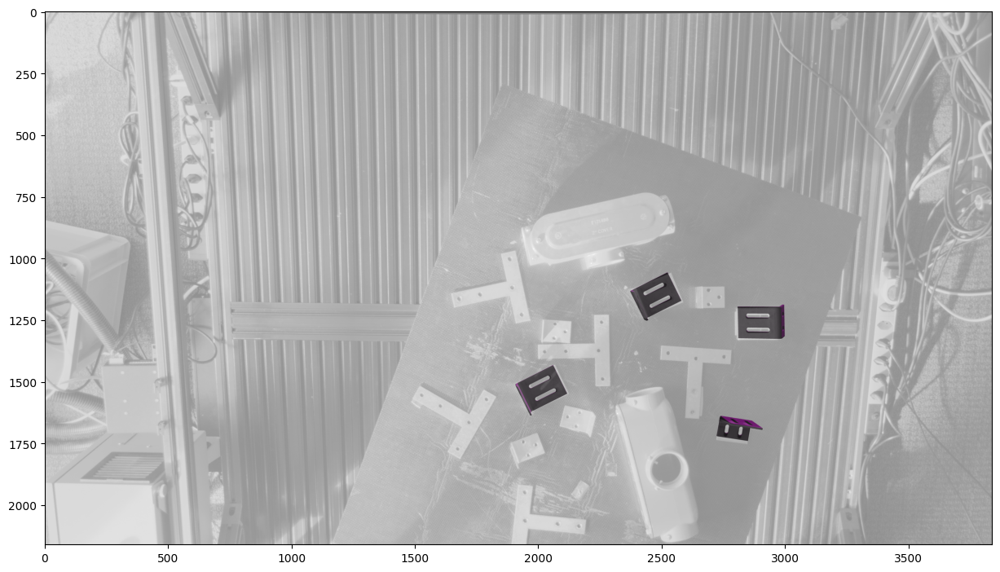

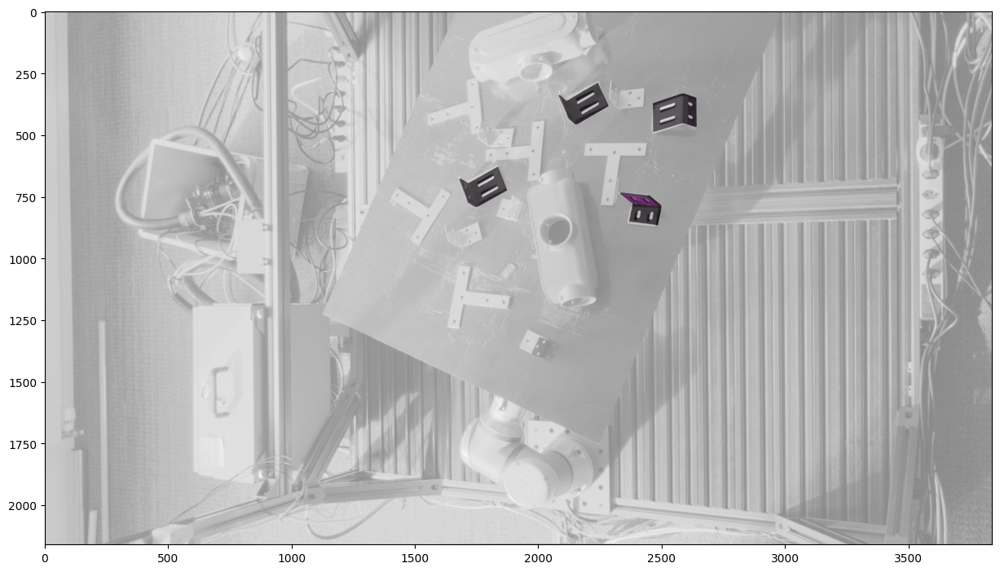

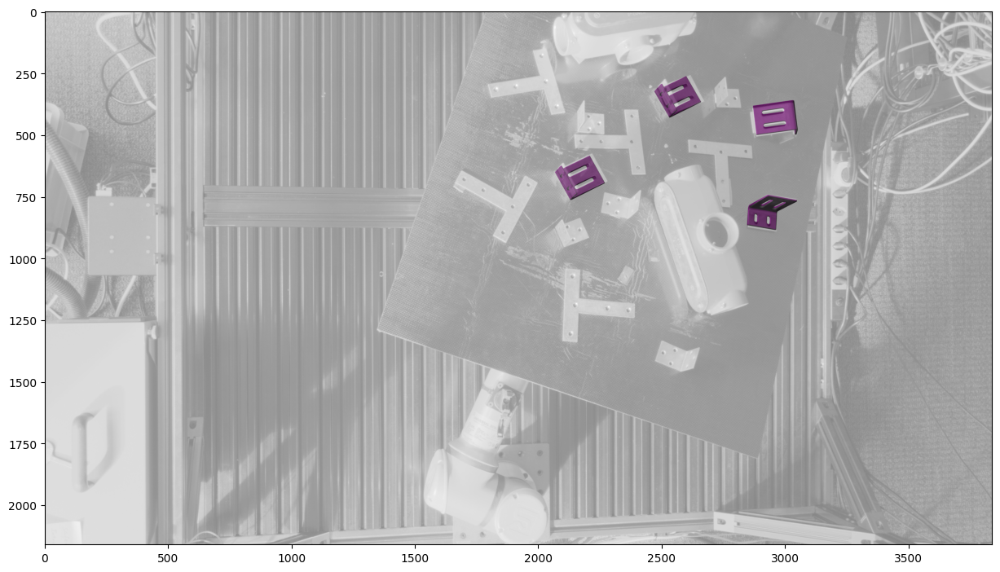

Camera 0 (cam1) saw 4 detections
Camera 1 (cam2) saw 4 detections
Camera 2 (cam3) saw 4 detections

Matched poses: 4
The following 6D Poses of the Detected Objects are homogeneous form
Object 0 pose:
 [[  -0.176   -0.869    0.462 -129.868]
 [   0.209    0.426    0.88   -15.139]
 [  -0.962    0.252    0.106 1836.924]
 [   0.       0.       0.       1.   ]]
Object 1 pose:
 [[   0.129   -0.163    0.978 -479.237]
 [  -0.97     0.184    0.159  -83.091]
 [  -0.206   -0.969   -0.134 1856.969]
 [   0.       0.       0.       1.   ]]
Object 2 pose:
 [[  -0.155   -0.871    0.467 -327.493]
 [   0.204    0.434    0.877  144.893]
 [  -0.967    0.231    0.11  1914.14 ]
 [   0.       0.       0.       1.   ]]
Object 3 pose:
 [[  -0.274    0.96     0.062 -515.085]
 [  -0.126   -0.1      0.987   99.084]
 [   0.953    0.263    0.148 1938.645]
 [   0.       0.       0.       1.   ]]
The following 6D Poses of the Detected Objects are in Euler & (xyz)
Object 0 — 6D pose [Rx° Ry° Rz° X Y Z]:
 [67.0756961601

In [25]:
# Object ID - 0
# Avaliable Scence and Detected - 000007 & 000012
# False Detection in - 
scene_dir = "./ipd/ipd_val/val/000007/"
models_dir = './ipd/ipd_models/models_eval/'
cam_ids = ["cam1", "cam2", "cam3"]
image_id = 1
obj_id = 0
obj_id_path = str(1000000+obj_id)[1:]
ply_file = os.path.join(models_dir, f"obj_{obj_id_path}.ply")
obj = trimesh.load(ply_file)
yolo_model_path = f'./models/detection/obj_{obj_id}/yolo11-detection-obj_{obj_id}.pt'
pose_model_path = f'./models/rot_models/rot_{obj_id}.pth'
pose_params = PoseEstimatorParams(
    yolo_model_path=yolo_model_path,
    pose_model_path=pose_model_path, 
    yolo_conf_thresh=0.01,
    #rotation_mode="quat"  # Using quaternion mode as in the checkpoint.
)
pose_estimator = PoseEstimator(pose_params)
t = time.time()
capture = Capture.from_dir(scene_dir, cam_ids, image_id, obj_id)
detections = pose_estimator._detect(capture)
pose_predictions = pose_estimator._match(capture, detections)
pose_estimator._estimate_rotation(pose_predictions)
print(time.time() - t)

for idx in range(len(capture.Ks)):
    plt.figure(figsize=(15, 15))
    plt.imshow(capture.images[idx])
    a, b = render_mask(obj, capture.Ks[idx], (capture.RTs[idx]), capture.images[0].shape[:2][::-1], [x.pose for x in pose_predictions])
    plt.imshow(a, alpha=0.5)
    plt.show()
    
# detections keys are 0,1,2 → map those back to your cam_ids list
for idx, dets in detections.items():
    cam_name = cam_ids[idx]
    print(f"Camera {idx} ({cam_name}) saw {len(dets)} detections")

print(f"\nMatched poses: {len(pose_predictions)}")
'''
The folllwowing code gives you full homogeneous pose
[ [ R11 R12 R13  tx ],
  [ R21 R22 R23  ty ],
  [ R31 R32 R33  tz ],
  [   0   0   0   1 ] ]
'''
print("The following 6D Poses of the Detected Objects are homogeneous form")
for i, pred in enumerate(pose_predictions):
    H = pred.pose   # 4×4 array
    print(f"Object {i} pose:\n", H)

print("The following 6D Poses of the Detected Objects are in Euler & (xyz)")
for i, pred in enumerate(pose_predictions):
    
    R = pred.pose[:3,:3]
    t = pred.pose[:3,3]
    # Convert R to Euler (xyz)
    euler = SRot.from_matrix(R).as_euler('xyz', degrees=True)
    pose6d = list(euler) + list(t)
    print(f"Object {i} — 6D pose [Rx° Ry° Rz° X Y Z]:\n", pose6d)


Auto-detected rotation mode from checkpoint: quat
Using rotation mode: quat
Loading camera parameters from: ./ipd/ipd_val/val/000006/scene_camera_cam3.json
[array([[  -0.103,    0.394,   -0.913,  175.663],
       [  -0.379,    0.833,    0.403,  338.722],
       [   0.92 ,    0.388,    0.064, 1762.206],
       [   0.   ,    0.   ,    0.   ,    1.   ]]), array([[  -0.981,   -0.183,    0.061,   71.958],
       [  -0.147,    0.915,    0.376,  204.455],
       [  -0.125,    0.36 ,   -0.925, 1707.208],
       [   0.   ,    0.   ,    0.   ,    1.   ]]), array([[   0.952,    0.296,    0.083, -224.707],
       [   0.242,   -0.888,    0.391,  305.5  ],
       [   0.189,   -0.352,   -0.917, 1727.041],
       [   0.   ,    0.   ,    0.   ,    1.   ]]), array([[  -0.243,   -0.922,   -0.303,  205.31 ],
       [   0.921,   -0.317,    0.225,    8.415],
       [  -0.303,   -0.224,    0.926, 1668.031],
       [   0.   ,    0.   ,    0.   ,    1.   ]])]
Processing image shape: (2160, 3840, 3)

0: 736x128

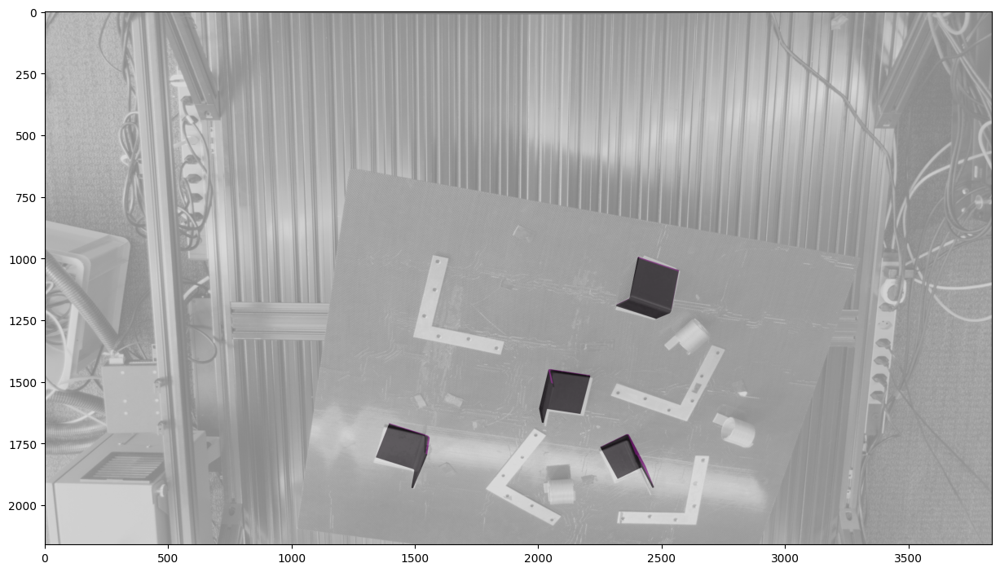

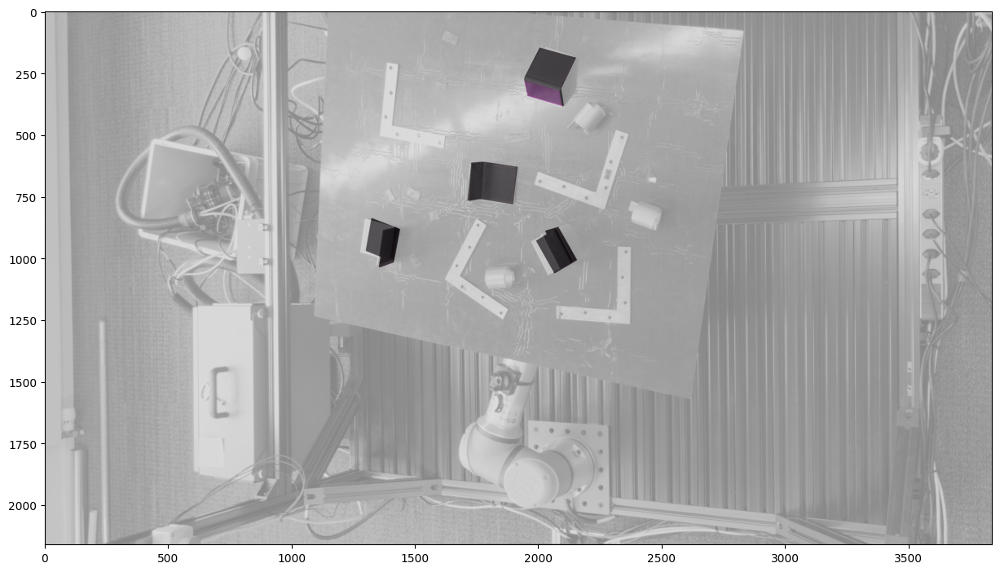

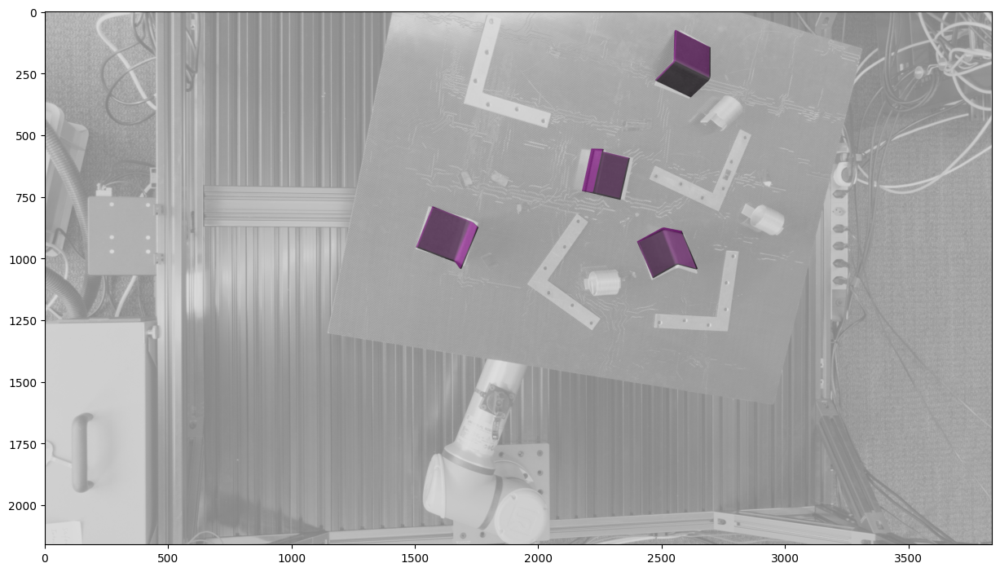

Camera 0 (cam1) saw 4 detections
Camera 1 (cam2) saw 4 detections
Camera 2 (cam3) saw 4 detections

Matched poses: 4
The following 6D Poses of the Detected Objects are homogeneous form
Object 0 pose:
 [[   0.152    0.899    0.411 -310.065]
 [  -0.844    0.335   -0.419  180.592]
 [  -0.514   -0.283    0.81  1824.02 ]
 [   0.       0.       0.       1.   ]]
Object 1 pose:
 [[   0.226   -0.423    0.877 -283.705]
 [   0.134   -0.878   -0.459 -158.546]
 [   0.965    0.222   -0.142 1851.209]
 [   0.       0.       0.       1.   ]]
Object 2 pose:
 [[  -0.914   -0.384   -0.132  112.595]
 [  -0.353    0.913   -0.206 -126.962]
 [   0.199   -0.141   -0.97  1772.264]
 [   0.       0.       0.       1.   ]]
Object 3 pose:
 [[   0.954    0.216   -0.21  -175.97 ]
 [   0.191   -0.972   -0.134  -18.12 ]
 [  -0.233    0.088   -0.969 1806.986]
 [   0.       0.       0.       1.   ]]
The following 6D Poses of the Detected Objects are in Euler & (xyz)
Object 0 — 6D pose [Rx° Ry° Rz° X Y Z]:
 [-19.285208413

In [27]:
# Object ID - 1
# Avaliable Scence and Detected - 000006 & 000008 (alignment problem???)  & 000011 & 000013 (Need to check!)
# False Detection in 000005 & 000007 
scene_dir = "./ipd/ipd_val/val/000006/"
models_dir = './ipd/ipd_models/models_eval/'
cam_ids = ["cam1", "cam2", "cam3"]
image_id = 1
obj_id = 1
obj_id_path = str(1000000+obj_id)[1:]
ply_file = os.path.join(models_dir, f"obj_{obj_id_path}.ply")
obj = trimesh.load(ply_file)
yolo_model_path = f'./models/detection/obj_{obj_id}/yolo11-detection-obj_{obj_id}.pt'
#pose_model_path = f'bpc/pose/pose_checkpoints/obj_{obj_id}/final_model.pth'
#pose_model_path = f'bpc/pose/val_checkpoints/obj_{obj_id}/best_model.pth'
pose_model_path = f'./models/rot_models/rot_{obj_id}.pth'
pose_params = PoseEstimatorParams(
    yolo_model_path=yolo_model_path,
    pose_model_path=pose_model_path, 
    yolo_conf_thresh=0.01,
    #rotation_mode="quat"  # Using quaternion mode as in the checkpoint.
)
pose_estimator = PoseEstimator(pose_params)
t = time.time()
capture = Capture.from_dir(scene_dir, cam_ids, image_id, obj_id)
detections = pose_estimator._detect(capture)
pose_predictions = pose_estimator._match(capture, detections)
pose_estimator._estimate_rotation(pose_predictions)
print(time.time() - t)

for idx in range(len(capture.Ks)):
    plt.figure(figsize=(15, 15))
    plt.imshow(capture.images[idx])
    a, b = render_mask(obj, capture.Ks[idx], (capture.RTs[idx]), capture.images[0].shape[:2][::-1], [x.pose for x in pose_predictions])
    plt.imshow(a, alpha=0.5)
    plt.show()

# detections keys are 0,1,2 → map those back to your cam_ids list
for idx, dets in detections.items():
    cam_name = cam_ids[idx]
    print(f"Camera {idx} ({cam_name}) saw {len(dets)} detections")

print(f"\nMatched poses: {len(pose_predictions)}")
'''
The folllwowing code gives you full homogeneous pose
[ [ R11 R12 R13  tx ],
  [ R21 R22 R23  ty ],
  [ R31 R32 R33  tz ],
  [   0   0   0   1 ] ]
'''
print("The following 6D Poses of the Detected Objects are homogeneous form")
for i, pred in enumerate(pose_predictions):
    H = pred.pose   # 4×4 array
    print(f"Object {i} pose:\n", H)

print("The following 6D Poses of the Detected Objects are in Euler & (xyz)")
for i, pred in enumerate(pose_predictions):
    
    R = pred.pose[:3,:3]
    t = pred.pose[:3,3]
    # Convert R to Euler (xyz)
    euler = SRot.from_matrix(R).as_euler('xyz', degrees=True)
    pose6d = list(euler) + list(t)
    print(f"Object {i} — 6D pose [Rx° Ry° Rz° X Y Z]:\n", pose6d)

Auto-detected rotation mode from checkpoint: quat
Using rotation mode: quat
Loading camera parameters from: ./ipd/ipd_val/val/000013/scene_camera_cam3.json
[array([[   0.477,   -0.077,   -0.875,  339.637],
       [   0.878,    0.005,    0.478,  120.593],
       [  -0.032,   -0.997,    0.07 , 1729.673],
       [   0.   ,    0.   ,    0.   ,    1.   ]]), array([[  -0.773,   -0.146,   -0.618,  -27.692],
       [   0.62 ,    0.036,   -0.784,  280.059],
       [   0.136,   -0.989,    0.063, 1776.909],
       [   0.   ,    0.   ,    0.   ,    1.   ]]), array([[   0.686,   -0.111,   -0.719,   41.532],
       [   0.721,   -0.021,    0.692,  144.865],
       [  -0.092,   -0.994,    0.066, 1765.836],
       [   0.   ,    0.   ,    0.   ,    1.   ]]), array([[   0.13 ,   -0.97 ,   -0.204,  263.924],
       [  -0.061,    0.197,   -0.978, -177.485],
       [   0.99 ,    0.14 ,   -0.034, 1737.041],
       [   0.   ,    0.   ,    0.   ,    1.   ]])]
Processing image shape: (2160, 3840, 3)

0: 736x128

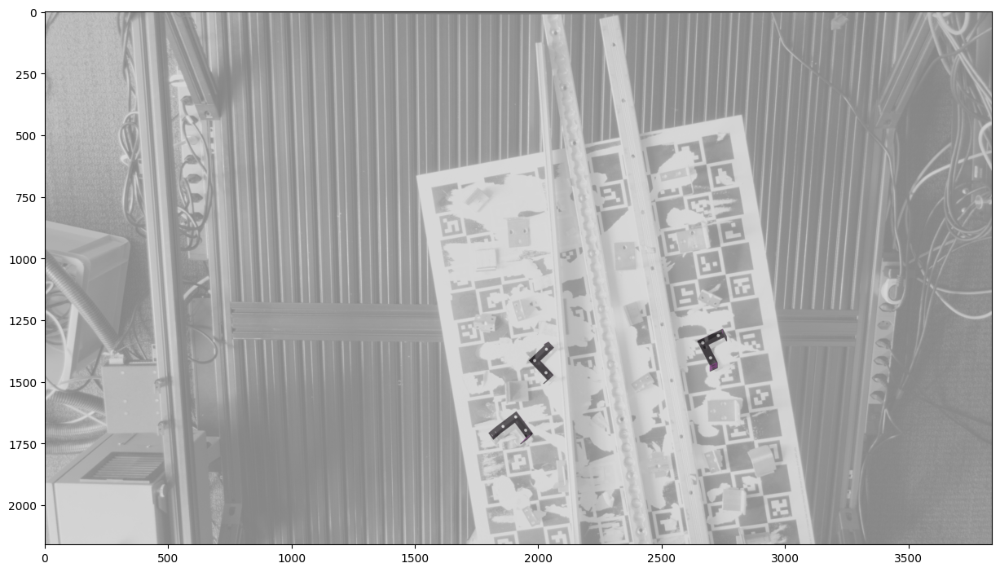

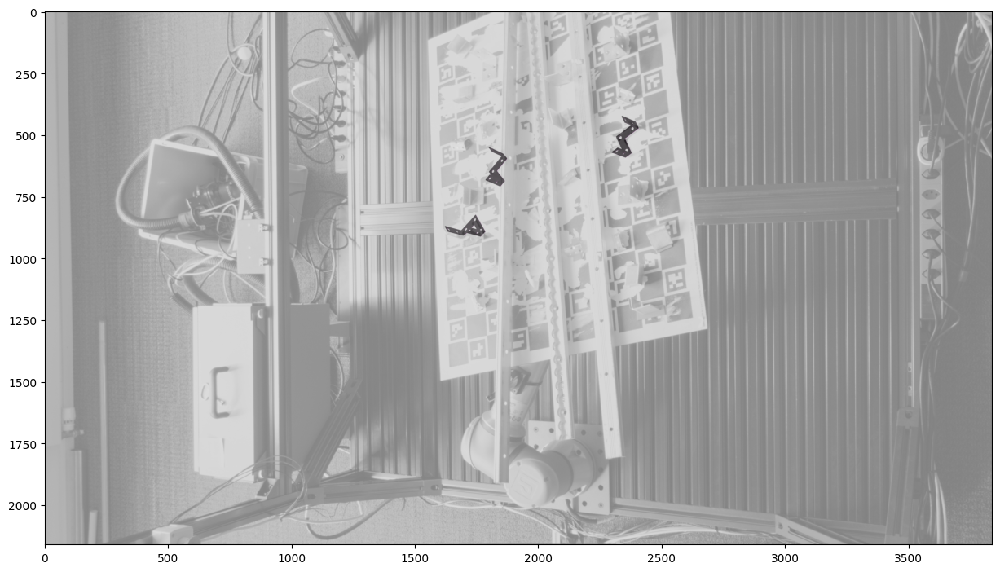

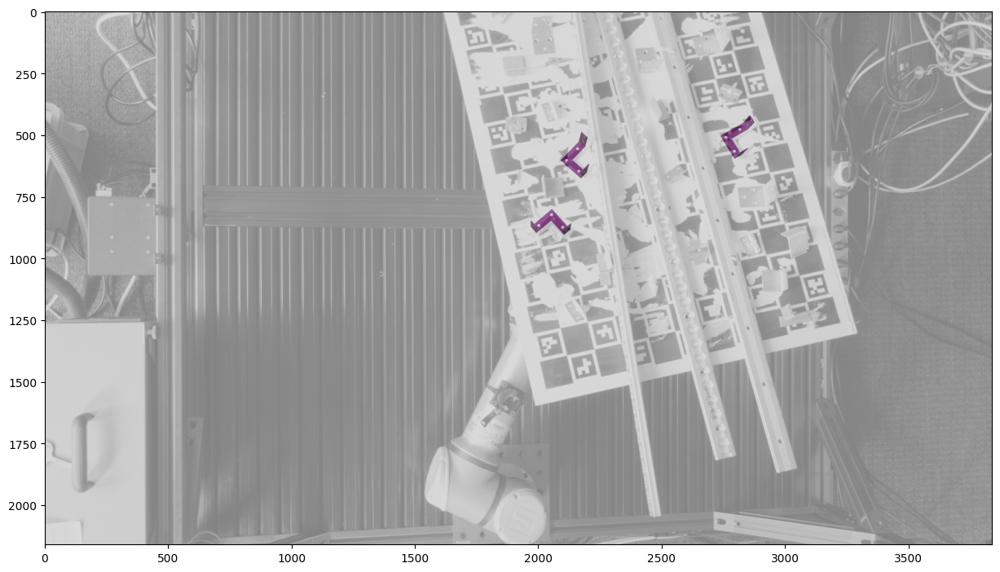

Camera 0 (cam1) saw 4 detections
Camera 1 (cam2) saw 3 detections
Camera 2 (cam3) saw 3 detections

Matched poses: 3
The following 6D Poses of the Detected Objects are homogeneous form
Object 0 pose:
 [[   0.767    0.09     0.635  -72.83 ]
 [  -0.64     0.16     0.751 -104.517]
 [  -0.034   -0.983    0.18  1847.455]
 [   0.       0.       0.       1.   ]]
Object 1 pose:
 [[  -0.484    0.058    0.873 -434.549]
 [  -0.866    0.11    -0.487   57.973]
 [  -0.124   -0.992   -0.003 1885.052]
 [   0.       0.       0.       1.   ]]
Object 2 pose:
 [[  -0.715    0.045    0.698 -132.996]
 [  -0.678    0.199   -0.707   23.965]
 [  -0.171   -0.979   -0.112 1875.224]
 [   0.       0.       0.       1.   ]]
The following 6D Poses of the Detected Objects are in Euler & (xyz)
Object 0 — 6D pose [Rx° Ry° Rz° X Y Z]:
 [-79.60603629614236, 1.9263192937266234, -39.85409225317457, -72.83023609099499, -104.51706094082928, 1847.4546384132816]
Object 1 — 6D pose [Rx° Ry° Rz° X Y Z]:
 [-90.18821346463598, 7.1

In [28]:
# Object ID - 4
# Avaliable Scence and Detected -  000009 (check)  & 000013 (Check) 
# False Detection in  000003 (check) & 000005 & 000006 (check) & 000007 & 000008 
scene_dir = "./ipd/ipd_val/val/000013/"
models_dir = './ipd/ipd_models/models_eval/'
cam_ids = ["cam1", "cam2", "cam3"]
image_id = 1
obj_id = 4
obj_id_path = str(1000000+obj_id)[1:]
ply_file = os.path.join(models_dir, f"obj_{obj_id_path}.ply")
obj = trimesh.load(ply_file)
yolo_model_path = f'./models/detection/obj_{obj_id}/yolo11-detection-obj_{obj_id}.pt'
#pose_model_path = f'bpc/pose/pose_checkpoints/obj_{obj_id}/final_model.pth'
#pose_model_path = f'bpc/pose/val_checkpoints/obj_{obj_id}/best_model.pth'
pose_model_path = f'./models/rot_models/rot_{obj_id}.pth'
pose_params = PoseEstimatorParams(
    yolo_model_path=yolo_model_path,
    pose_model_path=pose_model_path, 
    yolo_conf_thresh=0.01
    #rotation_mode="quat"  # Using quaternion mode as in the checkpoint.
)
pose_estimator = PoseEstimator(pose_params)
t = time.time()
capture = Capture.from_dir(scene_dir, cam_ids, image_id, obj_id)
detections = pose_estimator._detect(capture)
pose_predictions = pose_estimator._match(capture, detections)
pose_estimator._estimate_rotation(pose_predictions)
print(time.time() - t)

for idx in range(len(capture.Ks)):
    plt.figure(figsize=(15, 15))
    plt.imshow(capture.images[idx])
    a, b = render_mask(obj, capture.Ks[idx], (capture.RTs[idx]), capture.images[0].shape[:2][::-1], [x.pose for x in pose_predictions])
    plt.imshow(a, alpha=0.5)
    plt.show()
# detections keys are 0,1,2 → map those back to your cam_ids list
for idx, dets in detections.items():
    cam_name = cam_ids[idx]
    print(f"Camera {idx} ({cam_name}) saw {len(dets)} detections")

print(f"\nMatched poses: {len(pose_predictions)}")
'''
The folllwowing code gives you full homogeneous pose
[ [ R11 R12 R13  tx ],
  [ R21 R22 R23  ty ],
  [ R31 R32 R33  tz ],
  [   0   0   0   1 ] ]
'''
print("The following 6D Poses of the Detected Objects are homogeneous form")
for i, pred in enumerate(pose_predictions):
    H = pred.pose   # 4×4 array
    print(f"Object {i} pose:\n", H)

print("The following 6D Poses of the Detected Objects are in Euler & (xyz)")
for i, pred in enumerate(pose_predictions):
    
    R = pred.pose[:3,:3]
    t = pred.pose[:3,3]
    # Convert R to Euler (xyz)
    euler = SRot.from_matrix(R).as_euler('xyz', degrees=True)
    pose6d = list(euler) + list(t)
    print(f"Object {i} — 6D pose [Rx° Ry° Rz° X Y Z]:\n", pose6d)


Auto-detected rotation mode from checkpoint: quat
Using rotation mode: quat
Loading camera parameters from: ./ipd/ipd_val/val/000011/scene_camera_cam3.json
[array([[  -0.667,    0.074,   -0.741, -156.04 ],
       [  -0.742,   -0.148,    0.654,  111.816],
       [  -0.061,    0.986,    0.154, 1892.123],
       [   0.   ,    0.   ,    0.   ,    1.   ]]), array([[   0.966,   -0.016,    0.256,   67.001],
       [  -0.251,    0.163,    0.954,  182.781],
       [  -0.057,   -0.987,    0.153, 1887.692],
       [   0.   ,    0.   ,    0.   ,    1.   ]]), array([[   0.901,   -0.044,    0.431,  -10.657],
       [  -0.42 ,    0.158,    0.894,  -37.306],
       [  -0.107,   -0.986,    0.124, 1860.052],
       [   0.   ,    0.   ,    0.   ,    1.   ]]), array([[   0.461,   -0.074,   -0.884,  -61.016],
       [   0.882,    0.15 ,    0.447,  230.379],
       [   0.1  ,   -0.986,    0.134, 1903.478],
       [   0.   ,    0.   ,    0.   ,    1.   ]])]
Processing image shape: (2160, 3840, 3)

0: 736x128

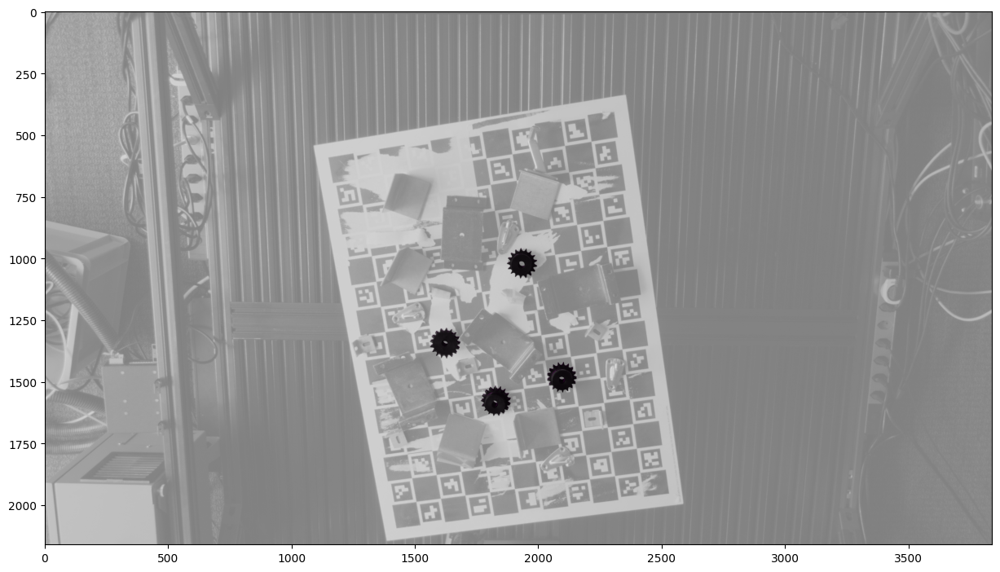

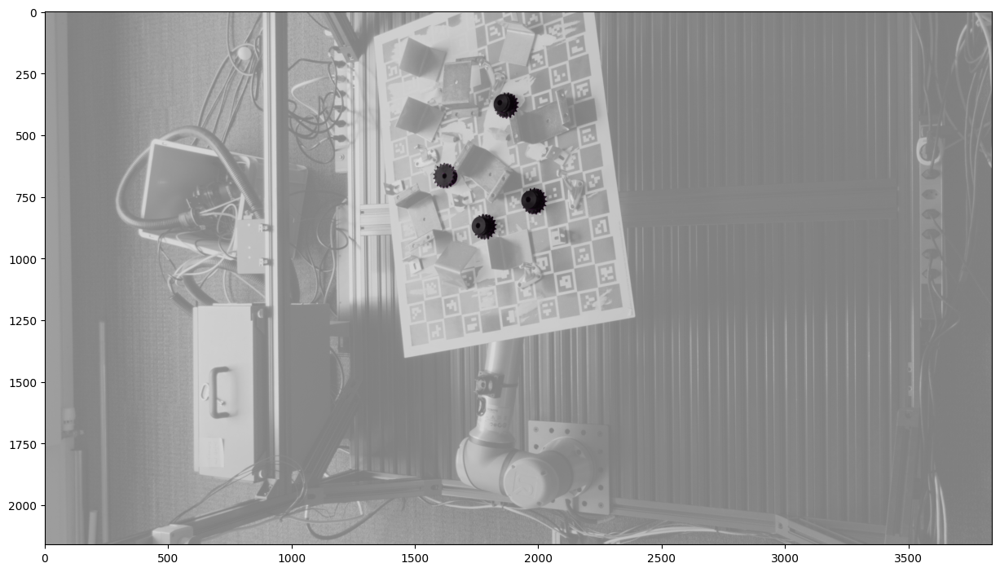

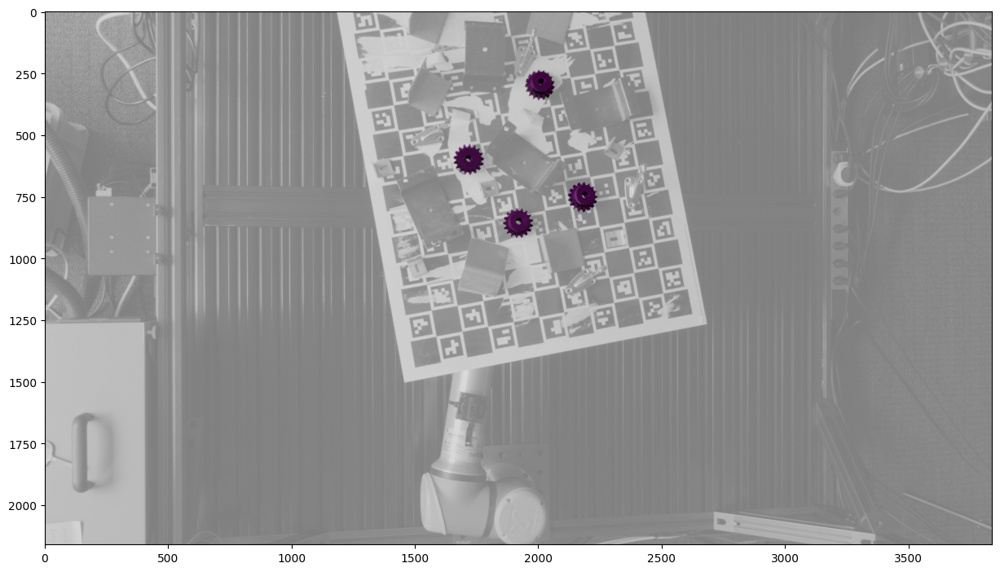

Camera 0 (cam1) saw 4 detections
Camera 1 (cam2) saw 4 detections
Camera 2 (cam3) saw 4 detections

Matched poses: 4
The following 6D Poses of the Detected Objects are homogeneous form
Object 0 pose:
 [[  -0.959   -0.075   -0.274 -151.46 ]
 [   0.267    0.089   -0.96   -41.655]
 [   0.097   -0.993   -0.065 1985.883]
 [   0.       0.       0.       1.   ]]
Object 1 pose:
 [[  -0.884   -0.064   -0.463  -71.37 ]
 [   0.455    0.109   -0.884  178.309]
 [   0.107   -0.992   -0.067 1999.961]
 [   0.       0.       0.       1.   ]]
Object 2 pose:
 [[   0.694    0.101    0.713   70.812]
 [   0.719   -0.064   -0.692   26.823]
 [  -0.024    0.993   -0.117 1965.096]
 [   0.       0.       0.       1.   ]]
Object 3 pose:
 [[  -0.519   -0.016    0.855  -24.158]
 [  -0.851    0.098   -0.515  -91.964]
 [  -0.076   -0.995   -0.065 1973.599]
 [   0.       0.       0.       1.   ]]
The following 6D Poses of the Detected Objects are in Euler & (xyz)
Object 0 — 6D pose [Rx° Ry° Rz° X Y Z]:
 [-93.763087707

In [30]:
# Object ID - 8
# Avaliable Scence and Detected -  000011 & 000010 & 000004 & 000003 
# False Detection in   
scene_dir = "./ipd/ipd_val/val/000011/"
models_dir = './ipd/ipd_models/models_eval/'
cam_ids = ["cam1", "cam2", "cam3"]
image_id = 1
obj_id = 8
obj_id_path = str(1000000+obj_id)[1:]
ply_file = os.path.join(models_dir, f"obj_{obj_id_path}.ply")
obj = trimesh.load(ply_file)
yolo_model_path = f'./models/detection/obj_{obj_id}/yolo11-detection-obj_{obj_id}.pt'
#pose_model_path = f'bpc/pose/pose_checkpoints/obj_{obj_id}/final_model.pth'
#pose_model_path = f'bpc/pose/val_checkpoints/obj_{obj_id}/best_model.pth'
pose_model_path = f'./models/rot_models/rot_{obj_id}.pth'
pose_params = PoseEstimatorParams(
    yolo_model_path=yolo_model_path,
    pose_model_path=pose_model_path, 
    yolo_conf_thresh=0.01
    #rotation_mode="quat"  # Using quaternion mode as in the checkpoint.
)
pose_estimator = PoseEstimator(pose_params)
t = time.time()
capture = Capture.from_dir(scene_dir, cam_ids, image_id, obj_id)
detections = pose_estimator._detect(capture)
pose_predictions = pose_estimator._match(capture, detections)
pose_estimator._estimate_rotation(pose_predictions)
print(time.time() - t)

for idx in range(len(capture.Ks)):
    plt.figure(figsize=(15, 15))
    plt.imshow(capture.images[idx])
    a, b = render_mask(obj, capture.Ks[idx], (capture.RTs[idx]), capture.images[0].shape[:2][::-1], [x.pose for x in pose_predictions])
    plt.imshow(a, alpha=0.5)
    plt.show()
# detections keys are 0,1,2 → map those back to your cam_ids list
for idx, dets in detections.items():
    cam_name = cam_ids[idx]
    print(f"Camera {idx} ({cam_name}) saw {len(dets)} detections")

print(f"\nMatched poses: {len(pose_predictions)}")
'''
The folllwowing code gives you full homogeneous pose
[ [ R11 R12 R13  tx ],
  [ R21 R22 R23  ty ],
  [ R31 R32 R33  tz ],
  [   0   0   0   1 ] ]
'''
print("The following 6D Poses of the Detected Objects are homogeneous form")
for i, pred in enumerate(pose_predictions):
    H = pred.pose   # 4×4 array
    print(f"Object {i} pose:\n", H)

print("The following 6D Poses of the Detected Objects are in Euler & (xyz)")
for i, pred in enumerate(pose_predictions):
    
    R = pred.pose[:3,:3]
    t = pred.pose[:3,3]
    # Convert R to Euler (xyz)
    euler = SRot.from_matrix(R).as_euler('xyz', degrees=True)
    pose6d = list(euler) + list(t)
    print(f"Object {i} — 6D pose [Rx° Ry° Rz° X Y Z]:\n", pose6d)


Auto-detected rotation mode from checkpoint: quat
Using rotation mode: quat
Loading camera parameters from: ./ipd/ipd_val/val/000005/scene_camera_cam3.json
[array([[   0.279,   -0.846,   -0.454, -194.82 ],
       [   0.074,   -0.452,    0.889,   63.458],
       [  -0.958,   -0.281,   -0.063, 1586.269],
       [   0.   ,    0.   ,    0.   ,    1.   ]]), array([[   0.293,    0.257,   -0.921,  174.26 ],
       [   0.127,   -0.965,   -0.228,  146.052],
       [  -0.948,   -0.05 ,   -0.316, 1707.293],
       [   0.   ,    0.   ,    0.   ,    1.   ]]), array([[   0.279,    0.094,    0.956, -238.708],
       [   0.122,    0.984,   -0.133,  236.33 ],
       [  -0.952,    0.153,    0.263, 1597.289],
       [   0.   ,    0.   ,    0.   ,    1.   ]]), array([[   0.274,   -0.863,   -0.425, -133.213],
       [   0.891,    0.394,   -0.225,  -58.513],
       [   0.362,   -0.317,    0.877, 1625.205],
       [   0.   ,    0.   ,    0.   ,    1.   ]]), array([[   0.289,   -0.655,   -0.698,  296.631],
  

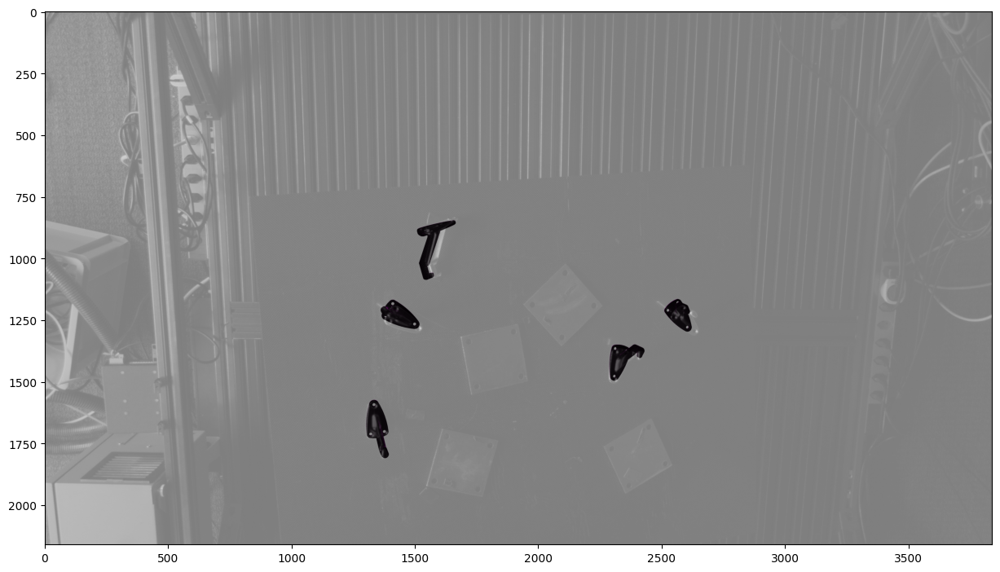

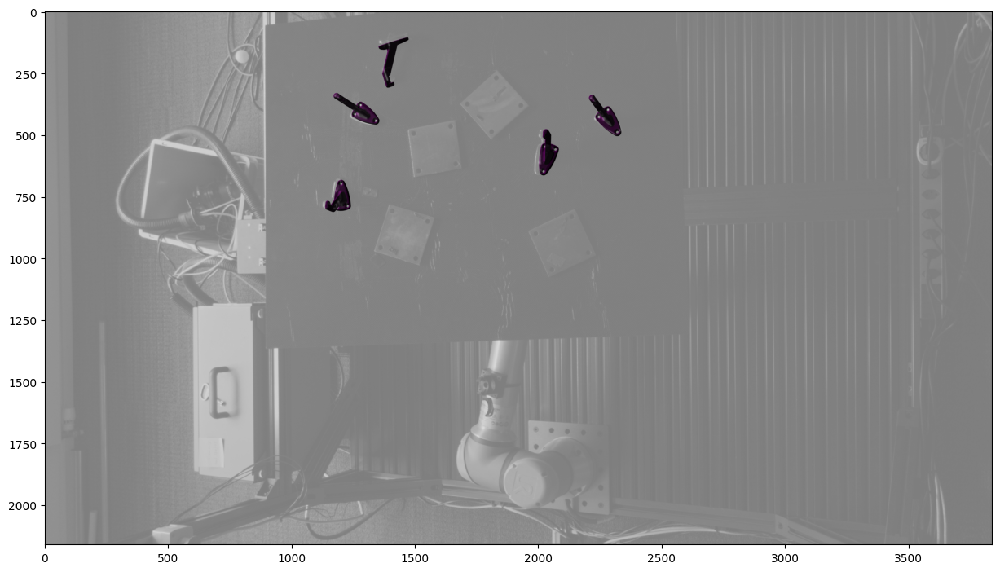

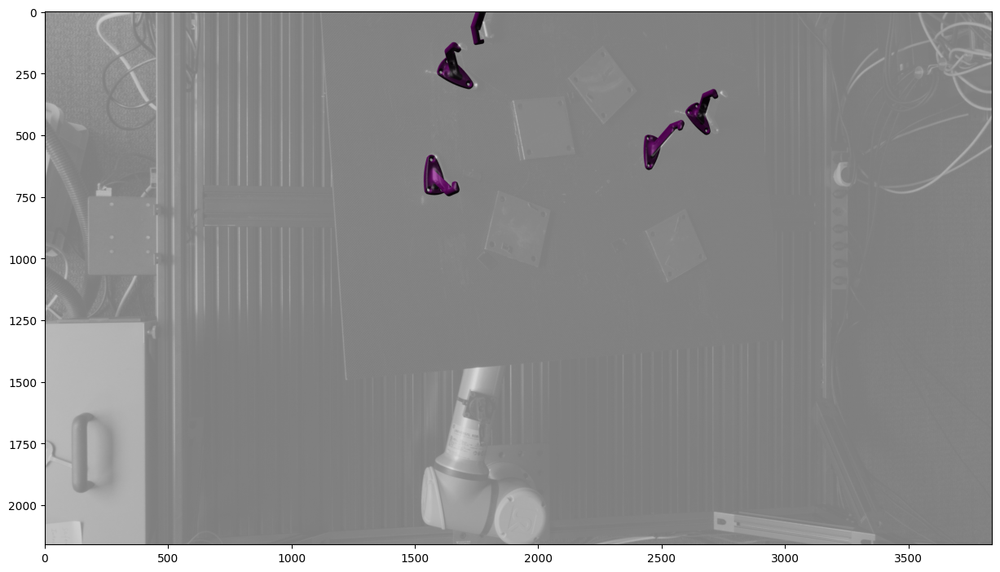

Camera 0 (cam1) saw 5 detections
Camera 1 (cam2) saw 5 detections
Camera 2 (cam3) saw 5 detections

Matched poses: 5
The following 6D Poses of the Detected Objects are homogeneous form
Object 0 pose:
 [[  -0.42    -0.213    0.882 -280.695]
 [   0.094    0.957    0.276   38.095]
 [  -0.903    0.199   -0.382 1837.495]
 [   0.       0.       0.       1.   ]]
Object 1 pose:
 [[  -0.395   -0.105   -0.913  116.16 ]
 [   0.094   -0.993    0.074  -28.627]
 [  -0.914   -0.056    0.402 1652.735]
 [   0.       0.       0.       1.   ]]
Object 2 pose:
 [[  -0.34     0.564    0.753 -382.381]
 [   0.086    0.816   -0.572  107.635]
 [  -0.937   -0.13    -0.326 1902.277]
 [   0.       0.       0.       1.   ]]
Object 3 pose:
 [[  -0.339    0.809    0.481   83.478]
 [   0.111    0.542   -0.833  148.849]
 [  -0.934   -0.229   -0.273 1688.617]
 [   0.       0.       0.       1.   ]]
Object 4 pose:
 [[  -0.183    0.899    0.398   34.25 ]
 [  -0.961   -0.249    0.12   248.306]
 [   0.207   -0.361    0.909 

In [31]:
# Object ID - 10
# Avaliable Scence and Detected - 000005 & 000011
# False Detection in   000003 & 000008 & 000009 
scene_dir = "./ipd/ipd_val/val/000005/"
models_dir = './ipd/ipd_models/models_eval/'
cam_ids = ["cam1", "cam2", "cam3"]
image_id = 1
obj_id = 10
obj_id_path = str(1000000+obj_id)[1:]
ply_file = os.path.join(models_dir, f"obj_{obj_id_path}.ply")
obj = trimesh.load(ply_file)
yolo_model_path = f'./models/detection/obj_{obj_id}/yolo11-detection-obj_{obj_id}.pt'
#pose_model_path = f'bpc/pose/pose_checkpoints/obj_{obj_id}/final_model.pth'
#pose_model_path = f'bpc/pose/val_checkpoints/obj_{obj_id}/best_model.pth'
pose_model_path = f'./models/rot_models/rot_{obj_id}.pth'
pose_params = PoseEstimatorParams(
    yolo_model_path=yolo_model_path,
    pose_model_path=pose_model_path, 
    yolo_conf_thresh=0.01
    #rotation_mode="quat"  # Using quaternion mode as in the checkpoint.
)
pose_estimator = PoseEstimator(pose_params)
t = time.time()
capture = Capture.from_dir(scene_dir, cam_ids, image_id, obj_id)
detections = pose_estimator._detect(capture)
pose_predictions = pose_estimator._match(capture, detections)
pose_estimator._estimate_rotation(pose_predictions)
print(time.time() - t)

for idx in range(len(capture.Ks)):
    plt.figure(figsize=(15, 15))
    plt.imshow(capture.images[idx])
    a, b = render_mask(obj, capture.Ks[idx], (capture.RTs[idx]), capture.images[0].shape[:2][::-1], [x.pose for x in pose_predictions])
    plt.imshow(a, alpha=0.5)
    plt.show()
# detections keys are 0,1,2 → map those back to your cam_ids list
for idx, dets in detections.items():
    cam_name = cam_ids[idx]
    print(f"Camera {idx} ({cam_name}) saw {len(dets)} detections")

print(f"\nMatched poses: {len(pose_predictions)}")
'''
The folllwowing code gives you full homogeneous pose
[ [ R11 R12 R13  tx ],
  [ R21 R22 R23  ty ],
  [ R31 R32 R33  tz ],
  [   0   0   0   1 ] ]
'''
print("The following 6D Poses of the Detected Objects are homogeneous form")
for i, pred in enumerate(pose_predictions):
    H = pred.pose   # 4×4 array
    print(f"Object {i} pose:\n", H)

print("The following 6D Poses of the Detected Objects are in Euler & (xyz)")
for i, pred in enumerate(pose_predictions):
    
    R = pred.pose[:3,:3]
    t = pred.pose[:3,3]
    # Convert R to Euler (xyz)
    euler = SRot.from_matrix(R).as_euler('xyz', degrees=True)
    pose6d = list(euler) + list(t)
    print(f"Object {i} — 6D pose [Rx° Ry° Rz° X Y Z]:\n", pose6d)


Auto-detected rotation mode from checkpoint: quat
Using rotation mode: quat
Loading camera parameters from: ./ipd/ipd_val/val/000003/scene_camera_cam3.json
[array([[  -0.807,    0.079,    0.586,  150.115],
       [  -0.572,    0.145,   -0.807,  278.716],
       [  -0.149,   -0.986,   -0.072, 1763.253],
       [   0.   ,    0.   ,    0.   ,    1.   ]]), array([[  -0.456,    0.886,    0.08 ,   70.988],
       [   0.886,    0.444,    0.134,   77.335],
       [   0.083,    0.132,   -0.988, 1668.764],
       [   0.   ,    0.   ,    0.   ,    1.   ]])]
Processing image shape: (2160, 3840, 3)

0: 736x1280 2 object_11s, 4.4ms
Speed: 3.8ms preprocess, 4.4ms inference, 0.6ms postprocess per image at shape (1, 3, 736, 1280)
Processing image shape: (2160, 3840, 3)

0: 736x1280 2 object_11s, 3.8ms
Speed: 3.7ms preprocess, 3.8ms inference, 0.6ms postprocess per image at shape (1, 3, 736, 1280)
Processing image shape: (2160, 3840, 3)

0: 736x1280 2 object_11s, 4.2ms
Speed: 3.9ms preprocess, 4.2ms inf

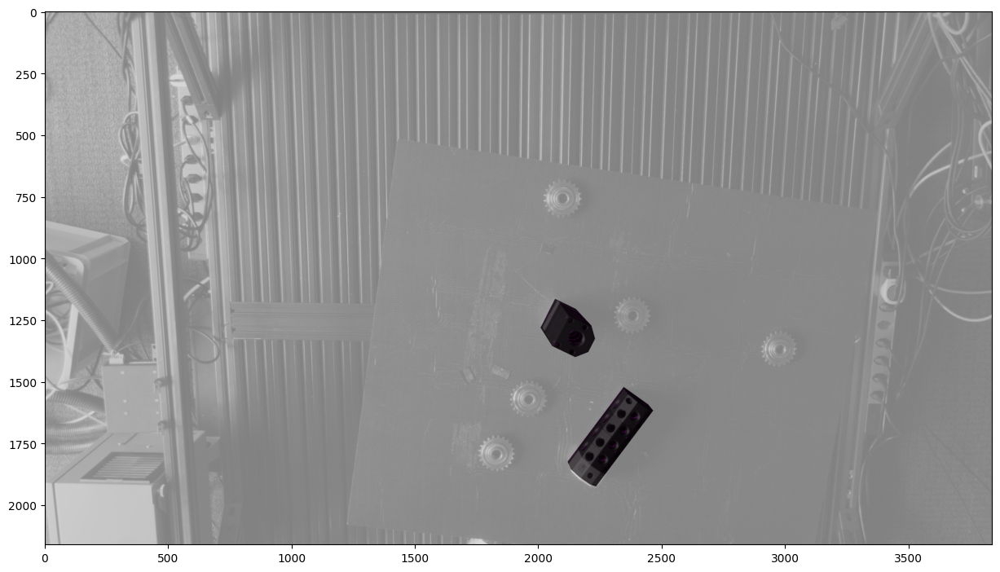

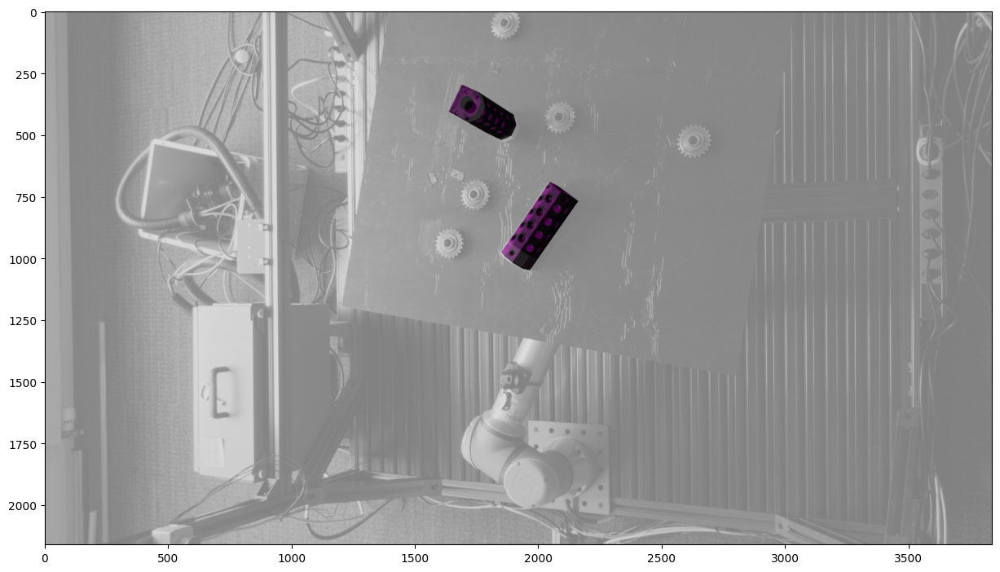

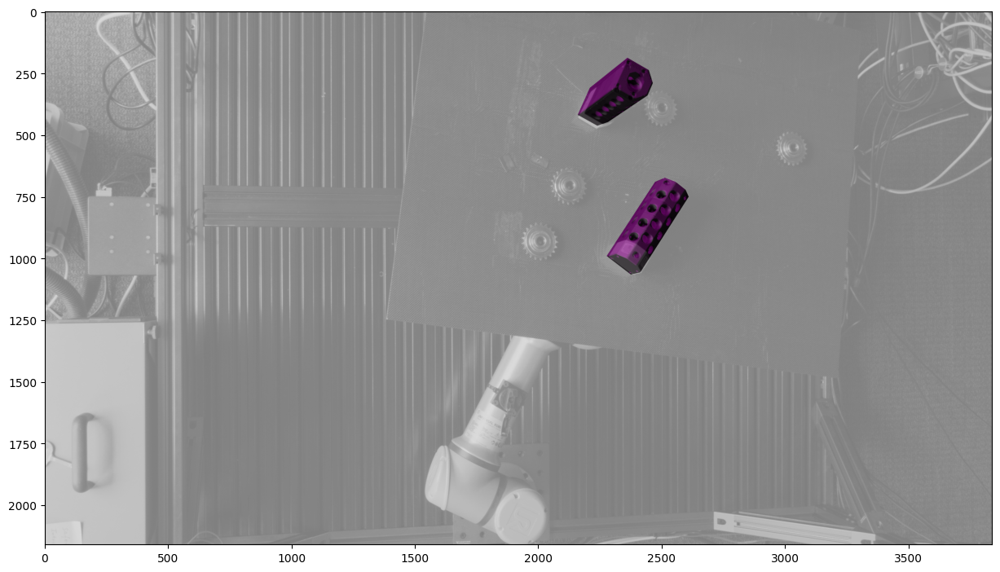

Camera 0 (cam1) saw 2 detections
Camera 1 (cam2) saw 2 detections
Camera 2 (cam3) saw 2 detections

Matched poses: 2
The following 6D Poses of the Detected Objects are homogeneous form
Object 0 pose:
 [[   0.426   -0.877   -0.221 -181.702]
 [  -0.885   -0.455    0.101  116.63 ]
 [  -0.189    0.153   -0.97  1778.515]
 [   0.       0.       0.       1.   ]]
Object 1 pose:
 [[   0.791   -0.22    -0.572 -253.254]
 [   0.599    0.086    0.796 -105.44 ]
 [  -0.126   -0.972    0.2   1850.728]
 [   0.       0.       0.       1.   ]]
The following 6D Poses of the Detected Objects are in Euler & (xyz)
Object 0 — 6D pose [Rx° Ry° Rz° X Y Z]:
 [171.04687604547976, 10.904714582971346, -64.31422276963583, -181.70174026761345, 116.62998442926948, 1778.5148361451463]
Object 1 — 6D pose [Rx° Ry° Rz° X Y Z]:
 [-78.39284180025801, 7.213747341864977, 37.16409130039662, -253.25382801363472, -105.4403979680777, 1850.728015770378]


In [32]:
# Object ID - 11
# Avaliable Scence and Detected - 000010 & 000003 & 000002
# False Detection in 000008 (Check) & 000007 (low cost) & 000006 & 000005
scene_dir = "./ipd/ipd_val/val/000003/"
models_dir = './ipd/ipd_models/models_eval/'
cam_ids = ["cam1", "cam2", "cam3"]
image_id = 1
obj_id = 11
obj_id_path = str(1000000+obj_id)[1:]
ply_file = os.path.join(models_dir, f"obj_{obj_id_path}.ply")
obj = trimesh.load(ply_file)
yolo_model_path = f'./models/detection/obj_{obj_id}/yolo11-detection-obj_{obj_id}.pt'
#pose_model_path = f'bpc/pose/pose_checkpoints/obj_{obj_id}/final_model.pth'
#pose_model_path = f'bpc/pose/val_checkpoints/obj_{obj_id}/best_model.pth'
pose_model_path = f'./models/rot_models/rot_{obj_id}.pth'
pose_params = PoseEstimatorParams(
    yolo_model_path=yolo_model_path,
    pose_model_path=pose_model_path, 
    yolo_conf_thresh=0.01
    #rotation_mode="quat"  # Using quaternion mode as in the checkpoint.
)
pose_estimator = PoseEstimator(pose_params)
t = time.time()
capture = Capture.from_dir(scene_dir, cam_ids, image_id, obj_id)
detections = pose_estimator._detect(capture)
pose_predictions = pose_estimator._match(capture, detections)
pose_estimator._estimate_rotation(pose_predictions)
print(time.time() - t)

for idx in range(len(capture.Ks)):
    plt.figure(figsize=(15, 15))
    plt.imshow(capture.images[idx])
    a, b = render_mask(obj, capture.Ks[idx], (capture.RTs[idx]), capture.images[0].shape[:2][::-1], [x.pose for x in pose_predictions])
    plt.imshow(a, alpha=0.5)
    plt.show()
# detections keys are 0,1,2 → map those back to your cam_ids list
for idx, dets in detections.items():
    cam_name = cam_ids[idx]
    print(f"Camera {idx} ({cam_name}) saw {len(dets)} detections")

print(f"\nMatched poses: {len(pose_predictions)}")
'''
The folllwowing code gives you full homogeneous pose
[ [ R11 R12 R13  tx ],
  [ R21 R22 R23  ty ],
  [ R31 R32 R33  tz ],
  [   0   0   0   1 ] ]
'''
print("The following 6D Poses of the Detected Objects are homogeneous form")
for i, pred in enumerate(pose_predictions):
    H = pred.pose   # 4×4 array
    print(f"Object {i} pose:\n", H)

print("The following 6D Poses of the Detected Objects are in Euler & (xyz)")
for i, pred in enumerate(pose_predictions):
    
    R = pred.pose[:3,:3]
    t = pred.pose[:3,3]
    # Convert R to Euler (xyz)
    euler = SRot.from_matrix(R).as_euler('xyz', degrees=True)
    pose6d = list(euler) + list(t)
    print(f"Object {i} — 6D pose [Rx° Ry° Rz° X Y Z]:\n", pose6d)


Auto-detected rotation mode from checkpoint: quat
Using rotation mode: quat
Loading camera parameters from: ./ipd/ipd_val/val/000001/scene_camera_cam3.json
[array([[   0.901,   -0.375,   -0.216,  -80.4  ],
       [   0.321,    0.914,   -0.246,    6.372],
       [   0.29 ,    0.152,    0.945, 1710.557],
       [   0.   ,    0.   ,    0.   ,    1.   ]]), array([[   0.013,   -0.977,    0.214,  -95.885],
       [   0.955,   -0.052,   -0.293,  200.701],
       [   0.297,    0.208,    0.932, 1722.119],
       [   0.   ,    0.   ,    0.   ,    1.   ]]), array([[   0.971,    0.196,   -0.135,   66.257],
       [  -0.186,    0.979,    0.086,  290.388],
       [   0.149,   -0.059,    0.987, 1690.473],
       [   0.   ,    0.   ,    0.   ,    1.   ]])]
Processing image shape: (2160, 3840, 3)

0: 736x1280 3 object_14s, 4.7ms
Speed: 4.0ms preprocess, 4.7ms inference, 0.6ms postprocess per image at shape (1, 3, 736, 1280)
Processing image shape: (2160, 3840, 3)

0: 736x1280 3 object_14s, 4.3ms
Speed:

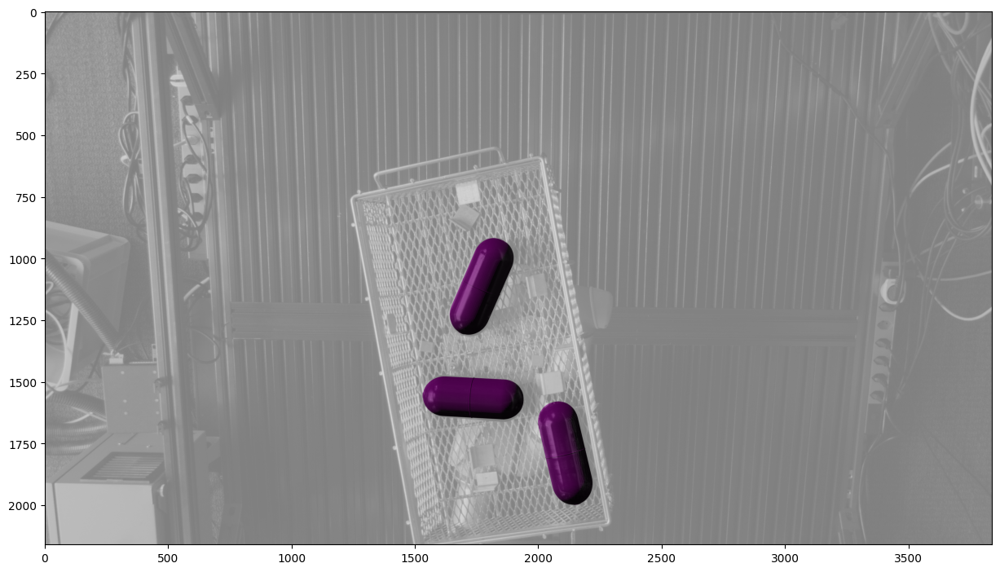

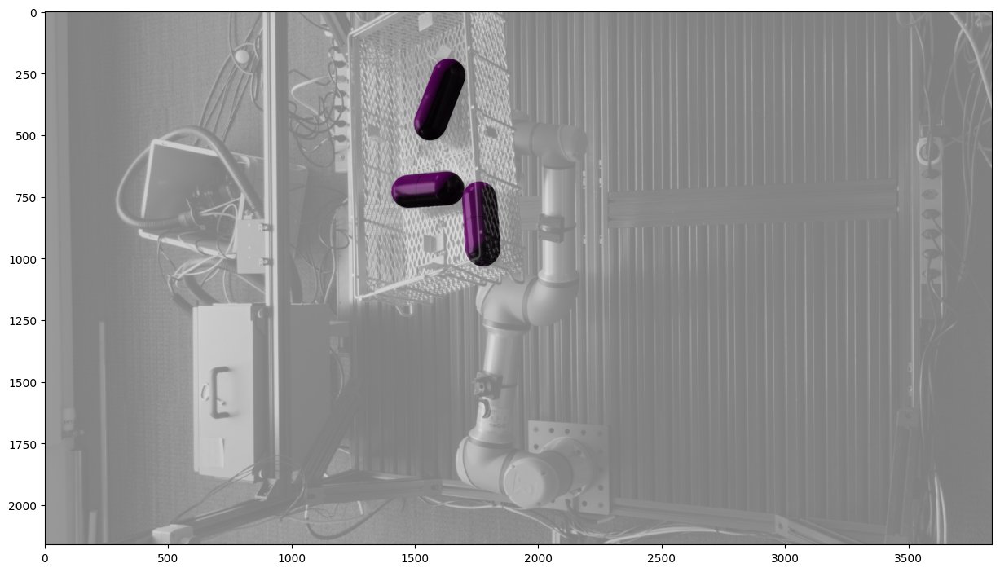

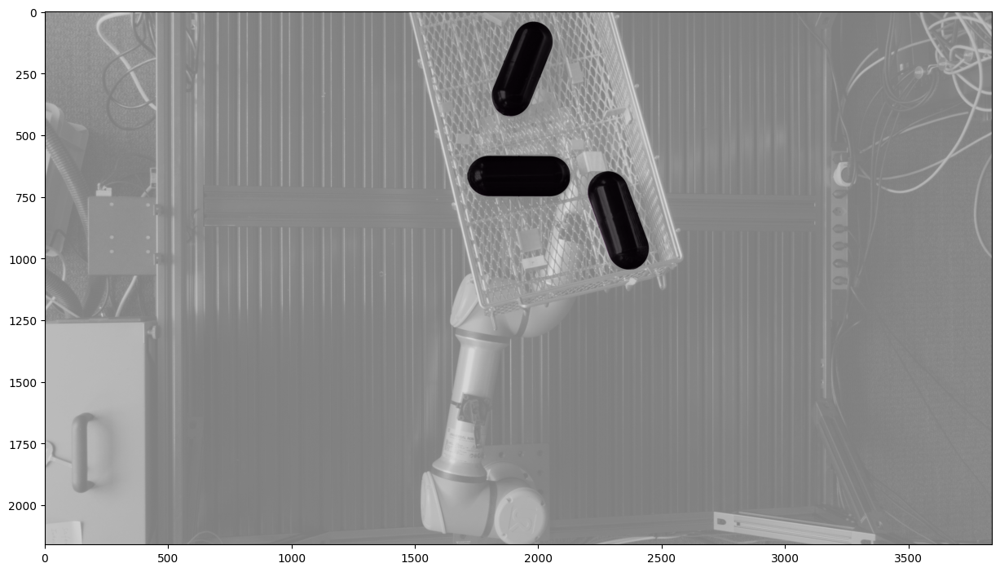

Camera 0 (cam1) saw 3 detections
Camera 1 (cam2) saw 3 detections
Camera 2 (cam3) saw 3 detections

Matched poses: 3
The following 6D Poses of the Detected Objects are homogeneous form
Object 0 pose:
 [[  -0.839    0.38     0.388  -24.099]
 [  -0.404   -0.914    0.022  171.947]
 [   0.363   -0.138    0.921 1826.821]
 [   0.       0.       0.       1.   ]]
Object 1 pose:
 [[  -0.925   -0.269    0.269 -180.676]
 [   0.166   -0.921   -0.351  -99.892]
 [   0.342   -0.281    0.897 1758.87 ]
 [   0.       0.       0.       1.   ]]
Object 2 pose:
 [[   0.007    1.       0.006  -13.863]
 [  -0.998    0.007    0.06   -20.518]
 [   0.06    -0.007    0.998 1793.208]
 [   0.       0.       0.       1.   ]]
The following 6D Poses of the Detected Objects are in Euler & (xyz)
Object 0 — 6D pose [Rx° Ry° Rz° X Y Z]:
 [-8.52074962081317, -21.305449183119475, -154.29563644960857, -24.098758050681624, 171.9470929647372, 1826.8212025152848]
Object 1 — 6D pose [Rx° Ry° Rz° X Y Z]:
 [-17.371751460657396, -2

In [33]:
# Object ID - 14 
# Avaliable Scence and Detected - 000001 & 000008 & 000014
# False Detection in 000005
scene_dir = "./ipd/ipd_val/val/000001/"
models_dir = './ipd/ipd_models/models_eval/'
cam_ids = ["cam1", "cam2", "cam3"]
image_id = 1
obj_id = 14
obj_id_path = str(1000000+obj_id)[1:]
ply_file = os.path.join(models_dir, f"obj_{obj_id_path}.ply")
obj = trimesh.load(ply_file)
yolo_model_path = f'./models/detection/obj_{obj_id}/yolo11-detection-obj_{obj_id}.pt'
#pose_model_path = f'bpc/pose/pose_checkpoints/obj_{obj_id}/final_model.pth'
#pose_model_path = f'bpc/pose/val_checkpoints/obj_{obj_id}/best_model.pth'
pose_model_path = f'./models/rot_models/rot_{obj_id}.pth'
pose_params = PoseEstimatorParams(
    yolo_model_path=yolo_model_path,
    pose_model_path=pose_model_path, 
    yolo_conf_thresh=0.01
    #rotation_mode="quat"  # Using quaternion mode as in the checkpoint.
)
pose_estimator = PoseEstimator(pose_params)
t = time.time()
capture = Capture.from_dir(scene_dir, cam_ids, image_id, obj_id)
detections = pose_estimator._detect(capture)
pose_predictions = pose_estimator._match(capture, detections)
pose_estimator._estimate_rotation(pose_predictions)
print(time.time() - t)

for idx in range(len(capture.Ks)):
    plt.figure(figsize=(15, 15))
    plt.imshow(capture.images[idx])
    a, b = render_mask(obj, capture.Ks[idx], (capture.RTs[idx]), capture.images[0].shape[:2][::-1], [x.pose for x in pose_predictions])
    plt.imshow(a, alpha=0.5)
    plt.show()
# detections keys are 0,1,2 → map those back to your cam_ids list
for idx, dets in detections.items():
    cam_name = cam_ids[idx]
    print(f"Camera {idx} ({cam_name}) saw {len(dets)} detections")

print(f"\nMatched poses: {len(pose_predictions)}")
'''
The folllwowing code gives you full homogeneous pose
[ [ R11 R12 R13  tx ],
  [ R21 R22 R23  ty ],
  [ R31 R32 R33  tz ],
  [   0   0   0   1 ] ]
'''
print("The following 6D Poses of the Detected Objects are homogeneous form")
for i, pred in enumerate(pose_predictions):
    H = pred.pose   # 4×4 array
    print(f"Object {i} pose:\n", H)

print("The following 6D Poses of the Detected Objects are in Euler & (xyz)")
for i, pred in enumerate(pose_predictions):
    
    R = pred.pose[:3,:3]
    t = pred.pose[:3,3]
    # Convert R to Euler (xyz)
    euler = SRot.from_matrix(R).as_euler('xyz', degrees=True)
    pose6d = list(euler) + list(t)
    print(f"Object {i} — 6D pose [Rx° Ry° Rz° X Y Z]:\n", pose6d)


Auto-detected rotation mode from checkpoint: quat
Using rotation mode: quat
Loading camera parameters from: ./ipd/ipd_val/val/000000/scene_camera_cam3.json
[array([[   0.912,    0.26 ,    0.318,   97.345],
       [  -0.311,   -0.068,    0.948,  149.256],
       [   0.269,   -0.963,    0.019, 1740.643],
       [   0.   ,    0.   ,    0.   ,    1.   ]]), array([[   0.199,    0.301,    0.932,   38.913],
       [  -0.969,   -0.081,    0.233,   66.739],
       [   0.145,   -0.95 ,    0.276, 1730.628],
       [   0.   ,    0.   ,    0.   ,    1.   ]]), array([[  -0.519,    0.293,    0.803,  143.044],
       [  -0.851,   -0.081,   -0.519,  343.372],
       [  -0.087,   -0.953,    0.291, 1735.076],
       [   0.   ,    0.   ,    0.   ,    1.   ]]), array([[   0.041,    0.277,   -0.96 , -114.297],
       [   0.997,   -0.079,    0.02 ,   -5.823],
       [  -0.07 ,   -0.958,   -0.279, 1690.562],
       [   0.   ,    0.   ,    0.   ,    1.   ]]), array([[   0.9  ,    0.266,    0.344,  -32.17 ],
  

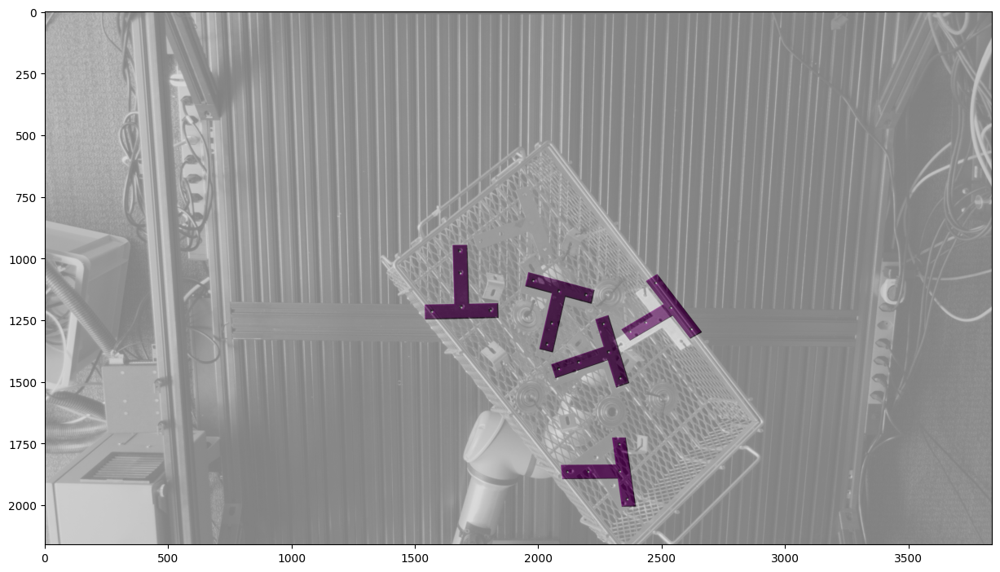

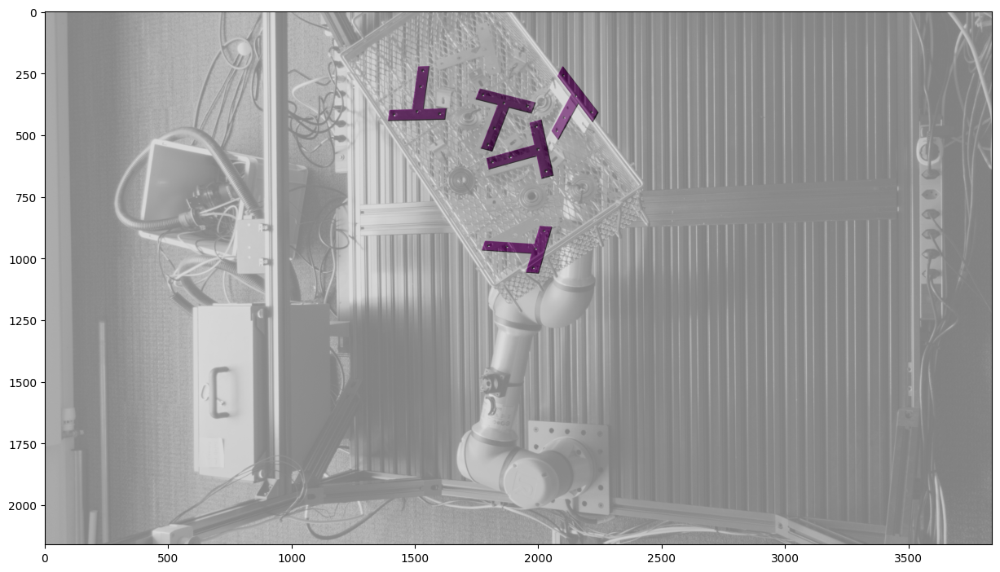

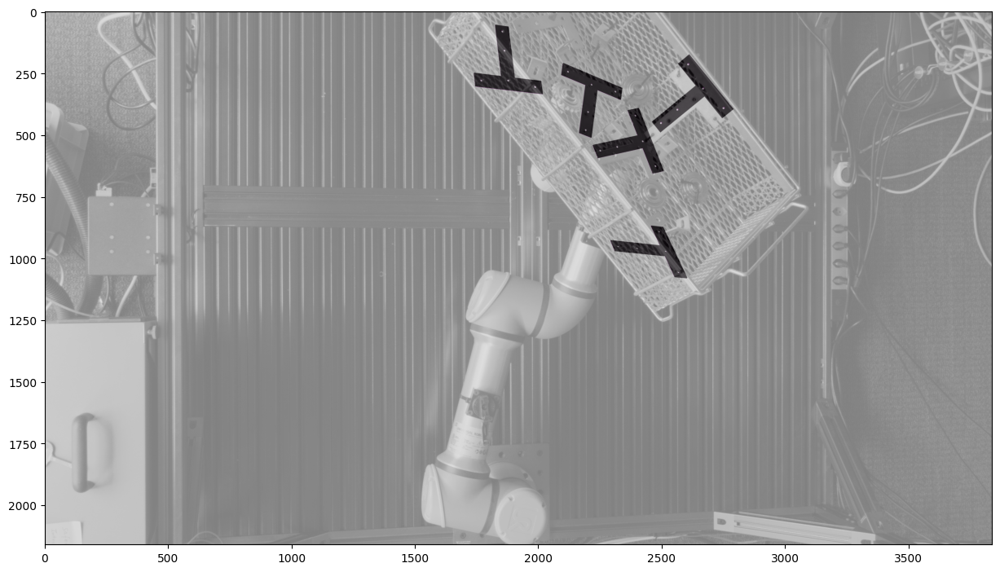

Camera 0 (cam1) saw 6 detections
Camera 1 (cam2) saw 6 detections
Camera 2 (cam3) saw 6 detections

Matched poses: 5
The following 6D Poses of the Detected Objects are homogeneous form
Object 0 pose:
 [[  -0.876   -0.357   -0.323 -207.981]
 [   0.228    0.283   -0.932   40.081]
 [   0.424   -0.89    -0.166 1848.45 ]
 [   0.       0.       0.       1.   ]]
Object 1 pose:
 [[  -0.079   -0.345    0.935    6.623]
 [  -0.949    0.314    0.035  186.105]
 [  -0.306   -0.884   -0.352 1800.351]
 [   0.       0.       0.       1.   ]]
Object 2 pose:
 [[  -0.715    0.311   -0.626 -320.737]
 [   0.584   -0.227   -0.779  115.753]
 [  -0.384   -0.923   -0.02  1860.964]
 [   0.       0.       0.       1.   ]]
Object 3 pose:
 [[  -0.934   -0.308   -0.179 -232.871]
 [  -0.086    0.682   -0.727 -148.051]
 [   0.346   -0.664   -0.663 1796.481]
 [   0.       0.       0.       1.   ]]
Object 4 pose:
 [[  -0.172   -0.389   -0.905 -148.015]
 [   0.913    0.282   -0.295  114.973]
 [   0.37    -0.877    0.306 

In [34]:
# Object ID - 18
# Avaliable Scence and Detected - 000012 & 000000 & 000007 & 
# False Detection in 000006
scene_dir = "./ipd/ipd_val/val/000000/"
models_dir = './ipd/ipd_models/models_eval/'
cam_ids = ["cam1", "cam2", "cam3"]
image_id = 1
obj_id = 18
obj_id_path = str(1000000+obj_id)[1:]
ply_file = os.path.join(models_dir, f"obj_{obj_id_path}.ply")
obj = trimesh.load(ply_file)
yolo_model_path = f'./models/detection/obj_{obj_id}/yolo11-detection-obj_{obj_id}.pt'
#pose_model_path = f'bpc/pose/pose_checkpoints/obj_{obj_id}/final_model.pth'
#pose_model_path = f'bpc/pose/val_checkpoints/obj_{obj_id}/best_model.pth'
pose_model_path = f'./models/rot_models/rot_{obj_id}.pth'
pose_params = PoseEstimatorParams(
    yolo_model_path=yolo_model_path,
    pose_model_path=pose_model_path, 
    yolo_conf_thresh=0.01
    #rotation_mode="quat"  # Using quaternion mode as in the checkpoint.
)
pose_estimator = PoseEstimator(pose_params)
t = time.time()
capture = Capture.from_dir(scene_dir, cam_ids, image_id, obj_id)
detections = pose_estimator._detect(capture)
pose_predictions = pose_estimator._match(capture, detections)
pose_estimator._estimate_rotation(pose_predictions)
print(time.time() - t)

for idx in range(len(capture.Ks)):
    plt.figure(figsize=(15, 15))
    plt.imshow(capture.images[idx])
    a, b = render_mask(obj, capture.Ks[idx], (capture.RTs[idx]), capture.images[0].shape[:2][::-1], [x.pose for x in pose_predictions])
    plt.imshow(a, alpha=0.5)
    plt.show()
# detections keys are 0,1,2 → map those back to your cam_ids list
for idx, dets in detections.items():
    cam_name = cam_ids[idx]
    print(f"Camera {idx} ({cam_name}) saw {len(dets)} detections")

print(f"\nMatched poses: {len(pose_predictions)}")
'''
The folllwowing code gives you full homogeneous pose
[ [ R11 R12 R13  tx ],
  [ R21 R22 R23  ty ],
  [ R31 R32 R33  tz ],
  [   0   0   0   1 ] ]
'''
print("The following 6D Poses of the Detected Objects are homogeneous form")
for i, pred in enumerate(pose_predictions):
    H = pred.pose   # 4×4 array
    print(f"Object {i} pose:\n", H)

print("The following 6D Poses of the Detected Objects are in Euler & (xyz)")
for i, pred in enumerate(pose_predictions):
    
    R = pred.pose[:3,:3]
    t = pred.pose[:3,3]
    # Convert R to Euler (xyz)
    euler = SRot.from_matrix(R).as_euler('xyz', degrees=True)
    pose6d = list(euler) + list(t)
    print(f"Object {i} — 6D pose [Rx° Ry° Rz° X Y Z]:\n", pose6d)


Auto-detected rotation mode from checkpoint: quat
Using rotation mode: quat
Loading camera parameters from: ./ipd/ipd_val/val/000014/scene_camera_cam3.json
[array([[  -0.084,   -0.994,    0.068,  142.964],
       [   0.971,   -0.097,   -0.217,  411.142],
       [   0.223,    0.048,    0.974, 1753.389],
       [   0.   ,    0.   ,    0.   ,    1.   ]]), array([[  -0.142,    0.979,   -0.149, -236.336],
       [   0.963,    0.171,    0.21 ,  349.049],
       [   0.231,   -0.113,   -0.966, 1781.625],
       [   0.   ,    0.   ,    0.   ,    1.   ]]), array([[   0.976,   -0.2  ,   -0.086,  274.093],
       [  -0.174,   -0.954,    0.245,  119.14 ],
       [  -0.131,   -0.224,   -0.966, 1675.382],
       [   0.   ,    0.   ,    0.   ,    1.   ]])]
Processing image shape: (2160, 3840, 3)

0: 736x1280 3 object_19s, 4.6ms
Speed: 3.8ms preprocess, 4.6ms inference, 1.0ms postprocess per image at shape (1, 3, 736, 1280)
Processing image shape: (2160, 3840, 3)

0: 736x1280 3 object_19s, 3.8ms
Speed:

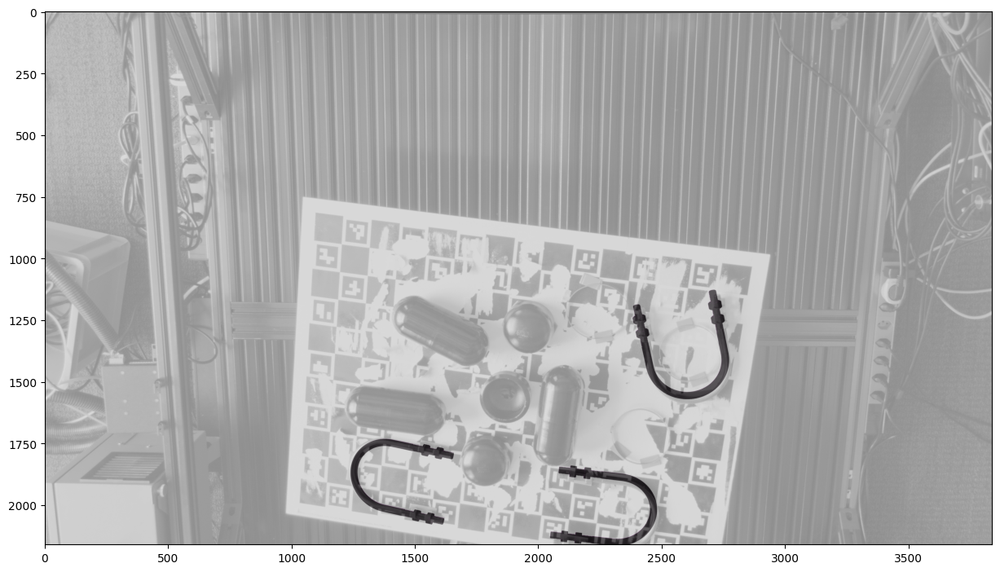

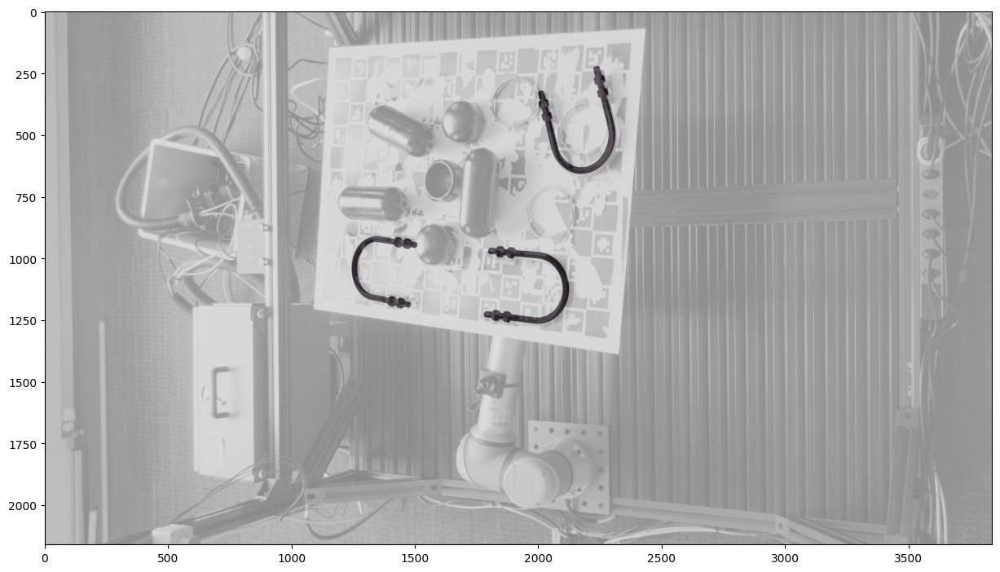

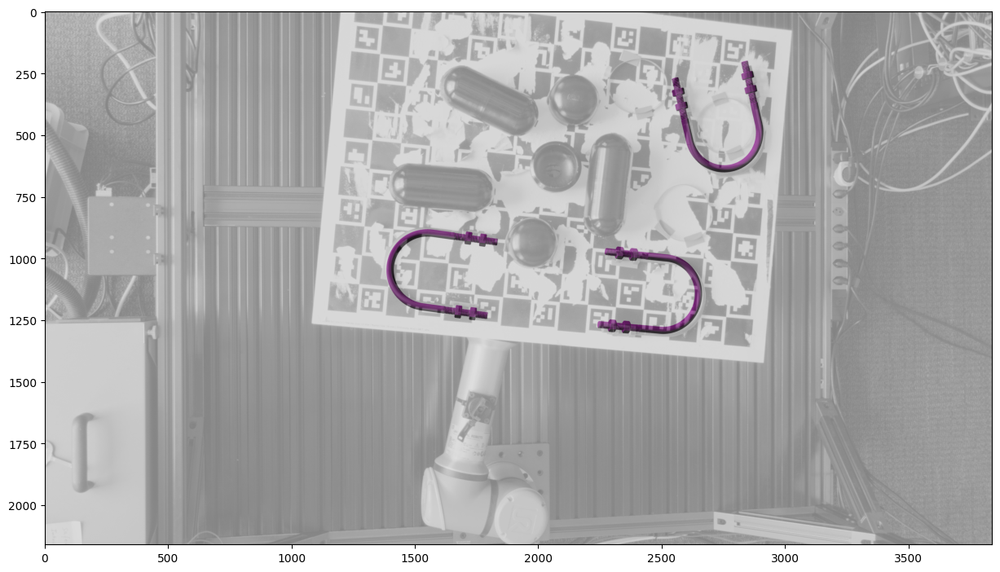

Camera 0 (cam1) saw 3 detections
Camera 1 (cam2) saw 3 detections
Camera 2 (cam3) saw 3 detections

Matched poses: 3
The following 6D Poses of the Detected Objects are homogeneous form
Object 0 pose:
 [[   0.146   -0.989    0.031  125.521]
 [  -0.989   -0.145    0.03  -185.332]
 [  -0.025   -0.035   -0.999 1803.157]
 [   0.       0.       0.       1.   ]]
Object 1 pose:
 [[  -0.973    0.232   -0.011 -376.187]
 [   0.232    0.972   -0.042   78.087]
 [   0.001   -0.043   -0.999 1816.969]
 [   0.       0.       0.       1.   ]]
Object 2 pose:
 [[   0.11     0.989    0.095 -248.702]
 [  -0.994    0.108    0.019 -226.759]
 [   0.009   -0.097    0.995 1817.578]
 [   0.       0.       0.       1.   ]]
The following 6D Poses of the Detected Objects are in Euler & (xyz)
Object 0 — 6D pose [Rx° Ry° Rz° X Y Z]:
 [-177.98664240697866, 1.41539114344768, -81.59112778574095, 125.52114157211476, -185.33198682736148, 1803.157429042381]
Object 1 — 6D pose [Rx° Ry° Rz° X Y Z]:
 [-177.5277629946968, -0.03

In [35]:
# Object ID - 19
# Avaliable Scence and Detected - 000009 & 000014
# False Detection in 000008
scene_dir = "./ipd/ipd_val/val/000014/"
models_dir = './ipd/ipd_models/models_eval/'
cam_ids = ["cam1", "cam2", "cam3"]
image_id = 1
obj_id = 19
obj_id_path = str(1000000+obj_id)[1:]
ply_file = os.path.join(models_dir, f"obj_{obj_id_path}.ply")
obj = trimesh.load(ply_file)
yolo_model_path = f'./models/detection/obj_{obj_id}/yolo11-detection-obj_{obj_id}.pt'
#pose_model_path = f'bpc/pose/pose_checkpoints/obj_{obj_id}/final_model.pth'
#pose_model_path = f'bpc/pose/val_checkpoints/obj_{obj_id}/best_model.pth'
pose_model_path = f'./models/rot_models/rot_{obj_id}.pth'
pose_params = PoseEstimatorParams(
    yolo_model_path=yolo_model_path,
    pose_model_path=pose_model_path, 
    yolo_conf_thresh=0.01
    #rotation_mode="quat"  # Using quaternion mode as in the checkpoint.
)
pose_estimator = PoseEstimator(pose_params)
t = time.time()
capture = Capture.from_dir(scene_dir, cam_ids, image_id, obj_id)
detections = pose_estimator._detect(capture)
pose_predictions = pose_estimator._match(capture, detections)
pose_estimator._estimate_rotation(pose_predictions)
print(time.time() - t)

for idx in range(len(capture.Ks)):
    plt.figure(figsize=(15, 15))
    plt.imshow(capture.images[idx])
    a, b = render_mask(obj, capture.Ks[idx], (capture.RTs[idx]), capture.images[0].shape[:2][::-1], [x.pose for x in pose_predictions])
    plt.imshow(a, alpha=0.5)
    plt.show()
# detections keys are 0,1,2 → map those back to your cam_ids list
for idx, dets in detections.items():
    cam_name = cam_ids[idx]
    print(f"Camera {idx} ({cam_name}) saw {len(dets)} detections")

print(f"\nMatched poses: {len(pose_predictions)}")
'''
The folllwowing code gives you full homogeneous pose
[ [ R11 R12 R13  tx ],
  [ R21 R22 R23  ty ],
  [ R31 R32 R33  tz ],
  [   0   0   0   1 ] ]
'''
print("The following 6D Poses of the Detected Objects are homogeneous form")
for i, pred in enumerate(pose_predictions):
    H = pred.pose   # 4×4 array
    print(f"Object {i} pose:\n", H)

print("The following 6D Poses of the Detected Objects are in Euler & (xyz)")
for i, pred in enumerate(pose_predictions):
    
    R = pred.pose[:3,:3]
    t = pred.pose[:3,3]
    # Convert R to Euler (xyz)
    euler = SRot.from_matrix(R).as_euler('xyz', degrees=True)
    pose6d = list(euler) + list(t)
    print(f"Object {i} — 6D pose [Rx° Ry° Rz° X Y Z]:\n", pose6d)


Auto-detected rotation mode from checkpoint: quat
Using rotation mode: quat
Loading camera parameters from: ./ipd/ipd_val/val/000011/scene_camera_cam3.json
[array([[   0.347,   -0.911,    0.225,  192.146],
       [  -0.937,   -0.328,    0.118,  -29.776],
       [  -0.034,   -0.252,   -0.967, 1728.002],
       [   0.   ,    0.   ,    0.   ,    1.   ]]), array([[   0.55 ,   -0.809,   -0.206,  196.673],
       [   0.802,    0.581,   -0.138,  190.215],
       [   0.232,   -0.089,    0.969, 1756.77 ],
       [   0.   ,    0.   ,    0.   ,    1.   ]]), array([[   0.084,   -0.975,   -0.208,   -0.402],
       [   0.983,    0.115,   -0.145,  226.563],
       [   0.165,   -0.192,    0.967, 1718.145],
       [   0.   ,    0.   ,    0.   ,    1.   ]]), array([[   0.972,   -0.049,   -0.229,  364.514],
       [   0.024,    0.994,   -0.109,  130.099],
       [   0.233,    0.101,    0.967, 1787.582],
       [   0.   ,    0.   ,    0.   ,    1.   ]])]
Processing image shape: (2160, 3840, 3)

0: 736x128

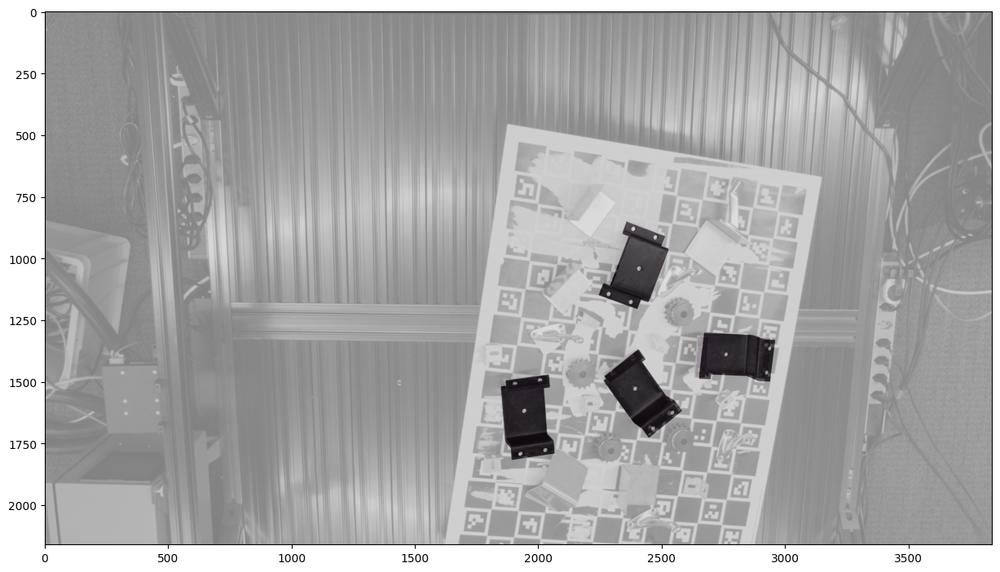

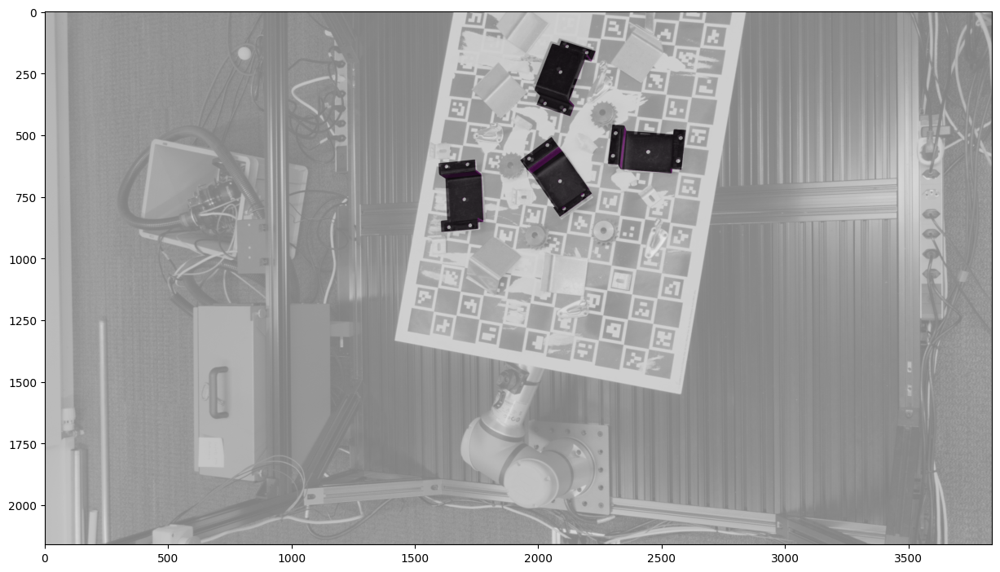

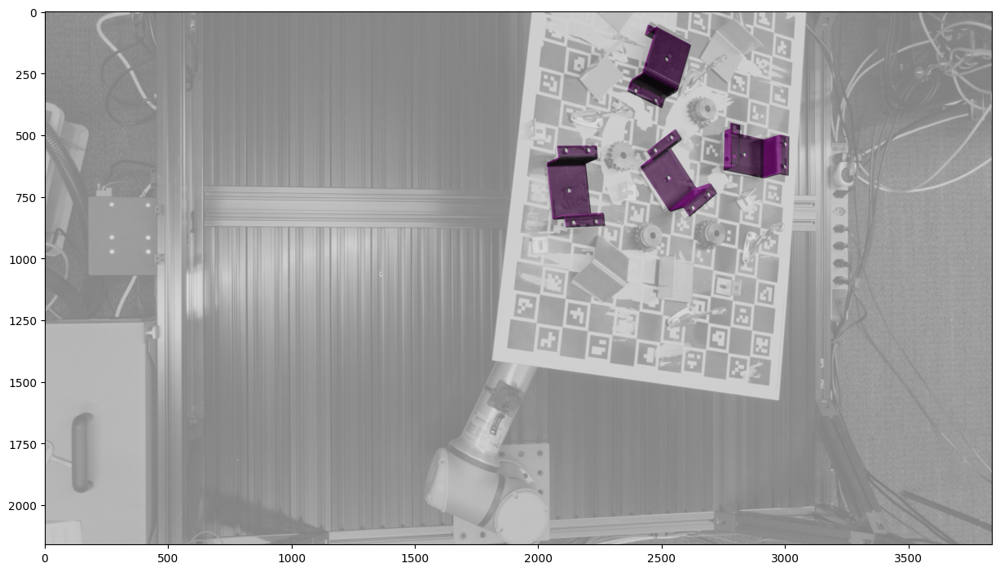

Camera 0 (cam1) saw 4 detections
Camera 1 (cam2) saw 4 detections
Camera 2 (cam3) saw 4 detections

Matched poses: 4
The following 6D Poses of the Detected Objects are homogeneous form
Object 0 pose:
 [[  -0.915    0.076    0.397 -464.718]
 [  -0.124   -0.988   -0.097   35.152]
 [   0.385   -0.138    0.913 1921.985]
 [   0.       0.       0.       1.   ]]
Object 1 pose:
 [[  -0.323    0.894   -0.309 -287.393]
 [   0.925    0.367    0.094  199.339]
 [   0.198   -0.255   -0.946 1903.441]
 [   0.       0.       0.       1.   ]]
Object 2 pose:
 [[  -0.565    0.743    0.359 -301.651]
 [  -0.817   -0.565   -0.118  -14.888]
 [   0.115   -0.36     0.926 1854.581]
 [   0.       0.       0.       1.   ]]
Object 3 pose:
 [[  -0.085    0.926    0.367 -109.806]
 [  -0.994   -0.054   -0.095  -43.581]
 [  -0.069   -0.373    0.925 1789.458]
 [   0.       0.       0.       1.   ]]
The following 6D Poses of the Detected Objects are in Euler & (xyz)
Object 0 — 6D pose [Rx° Ry° Rz° X Y Z]:
 [-8.5949792702

In [37]:
# Object ID - 20
# Avaliable Scence and Detected - 000011 & 000006 (check) & 000004 & 000002 (check)
# False Detection in 000014 & 000012 (check) & 000009 & 000008 & 000005 & 000001 & 000000 (low cost)
scene_dir = "./ipd/ipd_val/val/000011/"
models_dir = './ipd/ipd_models/models_eval/'
cam_ids = ["cam1", "cam2", "cam3"]
image_id = 2
obj_id = 20
obj_id_path = str(1000000+obj_id)[1:]
ply_file = os.path.join(models_dir, f"obj_{obj_id_path}.ply")
obj = trimesh.load(ply_file)
yolo_model_path = f'./models/detection/obj_{obj_id}/yolo11-detection-obj_{obj_id}.pt'
#pose_model_path = f'bpc/pose/pose_checkpoints/obj_{obj_id}/final_model.pth'
#pose_model_path = f'bpc/pose/val_checkpoints/obj_{obj_id}/best_model.pth'
pose_model_path = f'./models/rot_models/rot_{obj_id}.pth'
pose_params = PoseEstimatorParams(
    yolo_model_path=yolo_model_path,
    pose_model_path=pose_model_path, 
    yolo_conf_thresh=0.01
    #rotation_mode="quat"  # Using quaternion mode as in the checkpoint.
)
pose_estimator = PoseEstimator(pose_params)
t = time.time()
capture = Capture.from_dir(scene_dir, cam_ids, image_id, obj_id)
detections = pose_estimator._detect(capture)
pose_predictions = pose_estimator._match(capture, detections)
pose_estimator._estimate_rotation(pose_predictions)
print(time.time() - t)

for idx in range(len(capture.Ks)):
    plt.figure(figsize=(15, 15))
    plt.imshow(capture.images[idx])
    a, b = render_mask(obj, capture.Ks[idx], (capture.RTs[idx]), capture.images[0].shape[:2][::-1], [x.pose for x in pose_predictions])
    plt.imshow(a, alpha=0.5)
    plt.show()
# detections keys are 0,1,2 → map those back to your cam_ids list
for idx, dets in detections.items():
    cam_name = cam_ids[idx]
    print(f"Camera {idx} ({cam_name}) saw {len(dets)} detections")

print(f"\nMatched poses: {len(pose_predictions)}")
'''
The folllwowing code gives you full homogeneous pose
[ [ R11 R12 R13  tx ],
  [ R21 R22 R23  ty ],
  [ R31 R32 R33  tz ],
  [   0   0   0   1 ] ]
'''
print("The following 6D Poses of the Detected Objects are homogeneous form")
for i, pred in enumerate(pose_predictions):
    H = pred.pose   # 4×4 array
    print(f"Object {i} pose:\n", H)

print("The following 6D Poses of the Detected Objects are in Euler & (xyz)")
for i, pred in enumerate(pose_predictions):
    
    R = pred.pose[:3,:3]
    t = pred.pose[:3,3]
    # Convert R to Euler (xyz)
    euler = SRot.from_matrix(R).as_euler('xyz', degrees=True)
    pose6d = list(euler) + list(t)
    print(f"Object {i} — 6D pose [Rx° Ry° Rz° X Y Z]:\n", pose6d)
